# Symbolic Perturbation Detection Pipeline (Fixed Coordinates)

This notebook loads three models and uses **PySR** to symbolically recover perturbations.

**Key fix over notebook 3**: The encoder learns an arbitrary angle convention φ that
differs from the physical angle θ_phys by an unknown phase offset. We **calibrate** this
offset by fitting the unperturbed model's acceleration to −15·sin(θ), then transform
all data to θ_phys before running PySR. This is critical — without it, PySR sees
the perturbation polynomial shifted by an unknown constant, making recovery nearly impossible.

| Case | Model | Expected Outcome |
|------|-------|------------------|
| 1 | Unperturbed (full training) | V ≈ A·cos(θ), a ≈ −K·sin(θ) |
| 2 | Retrained-same (frozen enc/dec, same data) | Identical to Case 1 |
| 3 | Perturbed (frozen enc/dec, perturbed data) | Additional polynomial terms |

**Coordinate convention**: All PySR fits use θ_phys ∈ [−π, π] (the simulator's physical angle).

In [24]:
# Standard library imports
import os, sys
VENV_PATH = "/Users/harshit/Documents/UWM/F25/799-IS/Lagrangian_caVAE-main/.venv/lib/python3.9/site-packages"
if VENV_PATH not in sys.path:
    sys.path.append(VENV_PATH)

# Auto-detect project root (contains 'lag_caVAE' and 'examples' folders)
_cwd = os.path.abspath('')
PROJECT_ROOT = _cwd
for _ in range(5):
    if os.path.isdir(os.path.join(PROJECT_ROOT, 'examples')):
        break
    PROJECT_ROOT = os.path.dirname(PROJECT_ROOT)

if PROJECT_ROOT not in sys.path:
    sys.path.insert(0, PROJECT_ROOT)

print(f"Project root: {PROJECT_ROOT}")

import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from pytorch_lightning import seed_everything
from pysr import PySRRegressor

from examples.pend_lag_cavae_trainer import Model

seed_everything(0)
%matplotlib inline

Project root: /Users/harshit/Documents/UWM/F25/799-IS/Lagrangian_caVAE-main


## Configuration
Edit this cell for each experiment.

In [25]:
# ============================================================
# CONFIGURATION
# ============================================================

# Checkpoint filenames (in PARENT_DIR/results/pend/)
CKPT_UNPERTURBED    = 'pend-lag-cavae-T_p=4-epoch=983-step=7871.ckpt'
CKPT_RETRAINED_SAME = 'pend-lag-cavae-T_p=4-epoch=918-step=7351.ckpt'
CKPT_PERTURBED      = 'pend-lag-cavae-T_p=4-epoch=855-step=6847.ckpt'

# Perturbation type hint from user.
# This selects the PySR operator set for the perturbation fit.
# Options: 'polynomial', 'trigonometric', 'exponential', 'general'
PERTURBATION_TYPE = 'polynomial'

# Sampling — use [0, 2π] to match analysis notebook conventions
N_SAMPLES = 500
THETA_MIN, THETA_MAX = 0, 2 * np.pi

# PySR fitting range (same as evaluation range — full period needed
# for PySR to disambiguate cos from sin)
PYSR_FIT_MIN, PYSR_FIT_MAX = 0, 2 * np.pi

# PySR hyperparameters
PYSR_NITERATIONS = 100
PYSR_MAXSIZE     = 25

# DPI for plots (match analysis notebook)
DPI = 600

# Ground-truth perturbation (for validation plots)
# Set to None if unknown
# NOTE: The perturbation polynomial was defined w.r.t. the physical angle
# θ_phys ∈ [-π, π] in the simulation ODE. When plotting in φ ∈ [0, 2π],
# we convert: θ_phys = ((φ + π) % 2π) - π
ETA1, ETA2, ETA3 = -0.0481, 0.0113, 0.1125
M_TRUE, L_TRUE = 1.0, 1.0
ALPHA1 = 3 * ETA1 / (M_TRUE * L_TRUE**2)   # -0.1443
ALPHA2 = 3 * ETA2 / (M_TRUE * L_TRUE**2)   #  0.0339
ALPHA3 = 3 * ETA3 / (M_TRUE * L_TRUE**2)   #  0.3375

print(f"True perturbation coefficients:")
print(f"  alpha1 = {ALPHA1:.4f}, alpha2 = {ALPHA2:.4f}, alpha3 = {ALPHA3:.4f}")
print(f"  True Δa = {-ALPHA1:.4f}·φ_phys - {ALPHA2:.4f}·φ_phys² - {ALPHA3:.4f}·φ_phys³")
print(f"  where φ_phys = ((φ + π) mod 2π) - π  maps [0,2π] → [-π,π]")

True perturbation coefficients:
  alpha1 = -0.1443, alpha2 = 0.0339, alpha3 = 0.3375
  True Δa = 0.1443·φ_phys - 0.0339·φ_phys² - 0.3375·φ_phys³
  where φ_phys = ((φ + π) mod 2π) - π  maps [0,2π] → [-π,π]


## 1. Load All Three Models

In [26]:
ckpt_dir = os.path.join(PROJECT_ROOT, 'results', 'pend')

model_unpert = Model.load_from_checkpoint(
    os.path.join(ckpt_dir, CKPT_UNPERTURBED), map_location='cpu')
model_same = Model.load_from_checkpoint(
    os.path.join(ckpt_dir, CKPT_RETRAINED_SAME), map_location='cpu')
model_pert = Model.load_from_checkpoint(
    os.path.join(ckpt_dir, CKPT_PERTURBED), map_location='cpu')

model_unpert.eval()
model_same.eval()
model_pert.eval()
print("All 3 models loaded successfully.")

All 3 models loaded successfully.


## 2. Helper Functions

In [27]:
def extract_physics(model, theta_np):
    """
    Extract V(φ), M(φ), dV/dφ, and acceleration a(φ)
    from a trained model.
    
    At zero velocity and zero control:
        a(φ) = -(1/M(φ)) * dV/dφ
    This follows from the Lagrangian ODE: d_q_dot = -dV_dq / M_q
    """
    theta = torch.tensor(theta_np, dtype=torch.float32, requires_grad=True)
    cos_q = torch.cos(theta)
    sin_q = torch.sin(theta)
    cos_sin = torch.stack((cos_q, sin_q), dim=1)
    
    V = model.ode.V_net(cos_sin)
    M = model.ode.M_net(cos_sin)
    
    # dV/dφ via autograd (chain rule through cos/sin is automatic)
    dV_dtheta = torch.autograd.grad(V.sum(), theta, create_graph=False)[0]
    
    M_flat = M.squeeze()
    acc = -(1.0 / M_flat) * dV_dtheta
    
    return {
        'theta': theta_np,
        'V':         V.detach().numpy().flatten(),
        'M':         M.detach().numpy().flatten(),
        'dVdtheta':  dV_dtheta.detach().numpy().flatten(),
        'acc':       acc.detach().numpy().flatten(),
    }


def calibrate_phase_offset(phi, a_unpert, g=10.0, l=1.0):
    """
    Find the phase offset between the NN's learned angle φ and the
    physical angle θ_phys.
    
    The unperturbed pendulum has: a = -3g/(2l) * sin(θ_phys)
    The NN outputs a(φ). We fit: a(φ) ≈ A * sin(φ + offset)
    to recover the mapping θ_phys = φ + offset (mod 2π).
    
    Returns (offset, sign, amplitude) such that:
        θ_phys = sign * (φ + offset)
    """
    K = 3 * g / (2 * l)  # expected amplitude = 15.0
    
    best = None
    for s in [1.0, -1.0]:
        for off0 in np.linspace(0, 2*np.pi, 40):
            res = minimize(
                lambda o: np.mean((a_unpert - (-K * np.sin(s * (phi + o[0]))))**2),
                [off0], method='Nelder-Mead'
            )
            if best is None or res.fun < best[0]:
                best = (res.fun, s, res.x[0])
    
    mse, sign, offset = best
    
    # Also fit amplitude freely to check NN's scale
    res_free = minimize(
        lambda p: np.mean((a_unpert - (p[0] * np.sin(sign * (phi + offset))))**2),
        [-K], method='Nelder-Mead'
    )
    amp_fitted = res_free.x[0]
    
    return {
        'offset': offset,
        'sign': sign,
        'amplitude': amp_fitted,
        'mse': mse,
        'expected_amplitude': -K,
    }


def phi_to_theta_phys(phi, calib):
    """Convert NN angle φ to physical angle θ_phys ∈ [-π, π]."""
    theta = calib['sign'] * (phi + calib['offset'])
    return ((theta + np.pi) % (2 * np.pi)) - np.pi


def get_pysr_operators(perturbation_type):
    """
    Select PySR operator set based on the user's perturbation hint.
    """
    configs = {
        'polynomial': {
            'binary': ['+', '-', '*'],
            'unary':  [],  # PySR builds x^2 as x*x, x^3 as x*x*x
        },
        'trigonometric': {
            'binary': ['+', '-', '*'],
            'unary':  ['cos', 'sin'],
        },
        'exponential': {
            'binary': ['+', '-', '*'],
            'unary':  ['exp', 'square'],
        },
        'general': {
            'binary': ['+', '-', '*'],
            'unary':  ['cos', 'sin', 'square', 'cube'],
        },
    }
    return configs.get(perturbation_type, configs['general'])


def get_combined_operators(perturbation_type):
    """
    For fitting the FULL perturbed model output (V or a), we need BOTH
    trig operators (for the base physics: cos/sin) AND the user's 
    perturbation-specific operators to capture the perturbation terms.
    """
    base = get_pysr_operators('trigonometric')
    pert = get_pysr_operators(perturbation_type)
    
    merged_binary = list(set(base['binary'] + pert['binary']))
    merged_unary  = list(set(base['unary']  + pert['unary']))
    
    return {'binary': merged_binary, 'unary': merged_unary}


def run_pysr(X, y, perturbation_type='general',
             niterations=100, maxsize=20, parsimony=0.005,
             operators=None, variable_name='theta'):
    """
    Run PySR symbolic regression.
    Returns (model, best_idx, sympy_expr, prediction).
    Uses max-score method to select the best complexity/accuracy trade-off.
    """
    if operators is not None:
        ops = operators
    else:
        ops = get_pysr_operators(perturbation_type)
    
    sr = PySRRegressor(
        niterations=niterations,
        binary_operators=ops['binary'],
        unary_operators=ops['unary'],
        denoise=False,
        model_selection='best',
        maxsize=maxsize,
        parsimony=parsimony,
        populations=30,
        population_size=50,
        ncycles_per_iteration=550,
        weight_optimize=0.001,
        adaptive_parsimony_scaling=1000,
        random_state=42,
        procs=4,
        temp_equation_file=True,
    )
    sr.fit(X, y, variable_names=[variable_name])
    
    eqs = sr.equations_
    scores = eqs['score'].values.astype(float)
    elbow_i = np.argmax(scores)
    
    best_idx = eqs.index[elbow_i]
    expr = sr.sympy(index=best_idx)
    pred = sr.predict(X, index=best_idx)
    print(f"  Selected complexity {eqs['complexity'].values[elbow_i]:.0f} (max score)")
    print(f"  Expression: {expr}")
    return sr, best_idx, expr, pred


def plot_fit(x, y_true, y_pred, expr, title,
             y_ref=None, ref_label='True',
             label_true='Neural Net', label_pred='PySR',
             xlabel=r'$\theta_{\mathrm{phys}}$'):
    """Plot PySR fit against neural net output, with optional ground truth."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), dpi=DPI)
    
    axes[0].plot(x, y_true, 'b-', lw=2, label=label_true)
    axes[0].plot(x, y_pred, 'r--', lw=2, label=f'{label_pred}: {expr}')
    if y_ref is not None:
        axes[0].plot(x, y_ref, 'g:', lw=2, label=ref_label)
    axes[0].set_xlabel(xlabel, fontsize=14)
    axes[0].set_title(title)
    axes[0].legend(fontsize=8)
    axes[0].grid(True, alpha=0.3)
    
    residual = y_true - y_pred
    axes[1].plot(x, residual, 'k-', lw=1.5)
    axes[1].set_xlabel(xlabel, fontsize=14)
    axes[1].set_title(f'Residual (MSE={np.mean(residual**2):.2e})')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

print("Helper functions defined.")

Helper functions defined.


## 3. Extract Learned Physics from All Models

In [28]:
theta_range = np.linspace(THETA_MIN, THETA_MAX, N_SAMPLES)

phys_unpert = extract_physics(model_unpert, theta_range)
phys_same   = extract_physics(model_same,   theta_range)
phys_pert   = extract_physics(model_pert,    theta_range)

print(f"Physics extracted over φ ∈ [{THETA_MIN:.2f}, {THETA_MAX:.2f}] ({N_SAMPLES} pts)")
print(f"  Avg M (unperturbed):    {np.mean(phys_unpert['M']):.4f}")
print(f"  Avg M (retrained-same): {np.mean(phys_same['M']):.4f}")
print(f"  Avg M (perturbed):      {np.mean(phys_pert['M']):.4f}")

Physics extracted over φ ∈ [0.00, 6.28] (500 pts)
  Avg M (unperturbed):    0.6915
  Avg M (retrained-same): 0.6915
  Avg M (perturbed):      0.6915


## 3b. Calibrate Phase Offset (φ → θ_phys)

The encoder learns an arbitrary angle convention φ. The physical angle θ_phys
(used in the simulator ODE) differs by an unknown phase offset.

We recover this offset by fitting the unperturbed model's acceleration:
$$a(\phi) \approx -\frac{3g}{2l} \sin(\text{sign} \cdot (\phi + \text{offset}))$$

This gives us: $\theta_{\text{phys}} = \text{sign} \cdot (\phi + \text{offset})$

Phase offset calibration:
  sign    = +1
  offset  = 2.2050 rad (126.3 deg)
  amplitude (fitted) = -15.45
  amplitude (expected) = -15.00
  MSE of sinusoidal fit = 0.6618

  Mapping: θ_phys = +1 * (φ + 2.2050)


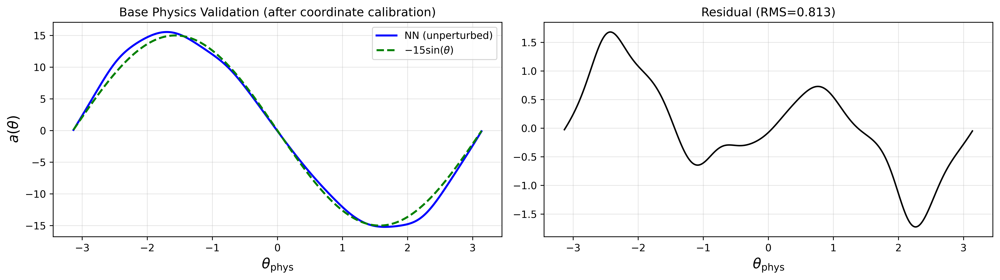


Correlation (NN vs true base): 0.9977


In [29]:
# Calibrate the phase offset using unperturbed model
calib = calibrate_phase_offset(theta_range, phys_unpert['acc'])

print("Phase offset calibration:")
print(f"  sign    = {calib['sign']:+.0f}")
print(f"  offset  = {calib['offset']:.4f} rad ({np.degrees(calib['offset']):.1f} deg)")
print(f"  amplitude (fitted) = {calib['amplitude']:.2f}")
print(f"  amplitude (expected) = {calib['expected_amplitude']:.2f}")
print(f"  MSE of sinusoidal fit = {calib['mse']:.4f}")
print(f"\n  Mapping: θ_phys = {calib['sign']:+.0f} * (φ + {calib['offset']:.4f})")

# Convert all data to physical coordinates
theta_phys = phi_to_theta_phys(theta_range, calib)

# Sort by theta_phys for clean plotting
sort_idx = np.argsort(theta_phys)
theta_phys_sorted = theta_phys[sort_idx]

# Verify: plot base physics in physical coordinates
a_true_base = -15.0 * np.sin(theta_phys_sorted)
a_nn_sorted = phys_unpert['acc'][sort_idx]

fig, axes = plt.subplots(1, 2, figsize=(14, 4), dpi=DPI)

axes[0].plot(theta_phys_sorted, a_nn_sorted, 'b-', lw=2, label='NN (unperturbed)')
axes[0].plot(theta_phys_sorted, a_true_base, 'g--', lw=2, label=r'$-15\sin(\theta)$')
axes[0].set_xlabel(r'$\theta_{\mathrm{phys}}$', fontsize=14)
axes[0].set_ylabel(r'$a(\theta)$', fontsize=14)
axes[0].set_title('Base Physics Validation (after coordinate calibration)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

residual = a_nn_sorted - a_true_base
axes[1].plot(theta_phys_sorted, residual, 'k-', lw=1.5)
axes[1].set_xlabel(r'$\theta_{\mathrm{phys}}$', fontsize=14)
axes[1].set_title(f'Residual (RMS={np.sqrt(np.mean(residual**2)):.3f})')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

corr = np.corrcoef(a_nn_sorted, a_true_base)[0,1]
print(f"\nCorrelation (NN vs true base): {corr:.4f}")

## 3c. Polynomial Regression Diagnostic

Before running PySR, check if a simple polynomial fit can recover the perturbation.
This tells us whether the signal is clean enough for symbolic regression to succeed.

**Acceleration space**: $\Delta a \approx c_1\theta + c_2\theta^2 + c_3\theta^3$ (degree-3)

**Potential space**: $\Delta V \approx c_2\theta^2 + c_3\theta^3 + c_4\theta^4$ (degree-4, since $V = -\int a\, d\theta$)

Correlation (NN Δa vs true Δa): 0.2656

Polynomial regression: Δa vs θ_phys
-----------------------------------------------------------------
  Degree 1: R² = 0.0945
  Degree 2: R² = 0.1466
  Degree 3: R² = 0.1468
    Fitted:  +0.0029·x³ +0.0721·x² -0.1752·x -0.2431
    True:    -0.3375·x³ -0.0339·x² +0.1443·x  +0.0000
    x³ ratio: -0.009
  Degree 4: R² = 0.2986
  Degree 5: R² = 0.3230

Correlation (NN ΔV vs true ΔV): 0.5759

Polynomial regression: ΔV vs θ_phys
-----------------------------------------------------------------
  Degree 2: R² = 0.4675
  Degree 3: R² = 0.8011
  Degree 4: R² = 0.8116
    Fitted:  +0.0041·x⁴ -0.0371·x³ +0.0229·x² +0.2829·x -0.2327
    True(×M): +0.0583·x⁴ +0.0078·x³ -0.0499·x² +0.0000·x +0.0000
    x⁴ ratio: 0.071
  Degree 5: R² = 0.9311
  Degree 6: R² = 0.9339


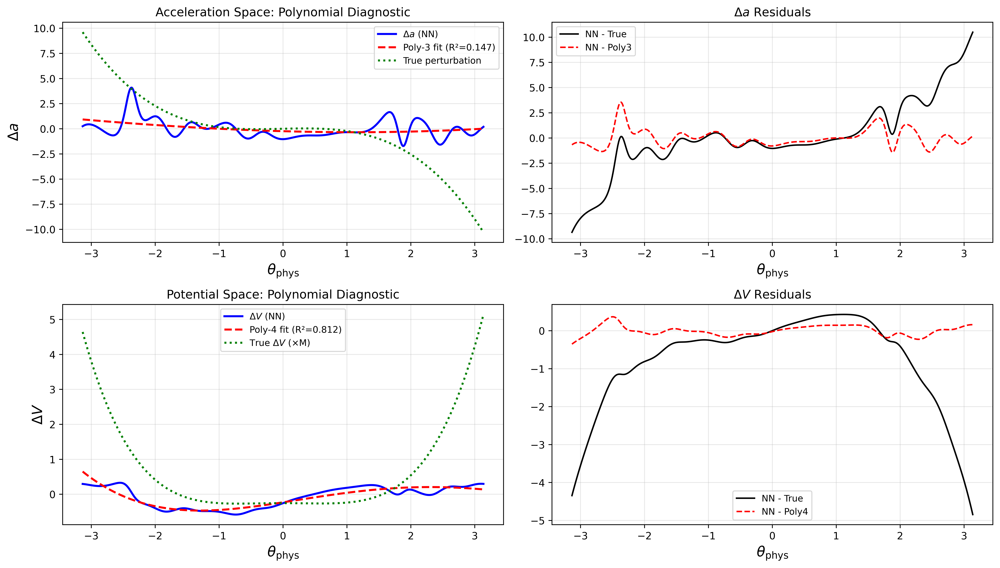

In [ ]:
# ============================================================
# Δa: Acceleration Space
# ============================================================
delta_a_all = phys_pert['acc'] - phys_unpert['acc']
delta_a_sorted = delta_a_all[sort_idx]

# Ground truth
true_delta_a = -ALPHA1 * theta_phys_sorted - ALPHA2 * theta_phys_sorted**2 - ALPHA3 * theta_phys_sorted**3

corr_da = np.corrcoef(delta_a_sorted, true_delta_a)[0, 1]
print(f"Correlation (NN Δa vs true Δa): {corr_da:.4f}")
print()

print("Polynomial regression: Δa vs θ_phys")
print("-" * 65)
for deg in [1, 2, 3, 4, 5]:
    coeffs = np.polyfit(theta_phys_sorted, delta_a_sorted, deg)
    pred = np.polyval(coeffs, theta_phys_sorted)
    ss_res = np.sum((delta_a_sorted - pred)**2)
    ss_tot = np.sum((delta_a_sorted - np.mean(delta_a_sorted))**2)
    r2 = 1 - ss_res / ss_tot
    print(f"  Degree {deg}: R² = {r2:.4f}")
    if deg == 3:
        print(f"    Fitted:  {coeffs[0]:+.4f}·x³ {coeffs[1]:+.4f}·x² {coeffs[2]:+.4f}·x {coeffs[3]:+.4f}")
        print(f"    True:    {-ALPHA3:+.4f}·x³ {-ALPHA2:+.4f}·x² {-ALPHA1:+.4f}·x  +0.0000")
        print(f"    x³ ratio: {coeffs[0] / (-ALPHA3):.3f}")

# ============================================================
# ΔV: Potential Space
# ============================================================
print()
V_unpert_aligned = phys_unpert['V'] - phys_unpert['V'][0]
V_pert_aligned   = phys_pert['V']   - phys_pert['V'][0]
delta_V_all = V_pert_aligned - V_unpert_aligned
delta_V_sorted = delta_V_all[sort_idx]

# Ground truth: ΔV = M * (α₁/2·θ² + α₂/3·θ³ + α₃/4·θ⁴), aligned at θ=0
M_scale = np.mean(phys_pert['M'])
true_delta_V_raw = M_scale * (
    (ALPHA1/2) * theta_phys_sorted**2 +
    (ALPHA2/3) * theta_phys_sorted**3 +
    (ALPHA3/4) * theta_phys_sorted**4
)
# Align: subtract value at θ closest to 0
idx_zero = np.argmin(np.abs(theta_phys_sorted))
true_delta_V = true_delta_V_raw - true_delta_V_raw[idx_zero]
delta_V_sorted_aligned = delta_V_sorted - delta_V_sorted[idx_zero]

corr_dV = np.corrcoef(delta_V_sorted_aligned, true_delta_V)[0, 1]
print(f"Correlation (NN ΔV vs true ΔV): {corr_dV:.4f}")
print()

print("Polynomial regression: ΔV vs θ_phys")
print("-" * 65)

for deg in [2, 3, 4, 5, 6]:
    coeffs = np.polyfit(theta_phys_sorted, delta_V_sorted, deg)
    pred = np.polyval(coeffs, theta_phys_sorted)
    ss_res = np.sum((delta_V_sorted - pred)**2)
    ss_tot = np.sum((delta_V_sorted - np.mean(delta_V_sorted))**2)
    r2 = 1 - ss_res / ss_tot
    print(f"  Degree {deg}: R² = {r2:.4f}")
    if deg == 4:
        print(f"    Fitted:  {coeffs[0]:+.4f}·x⁴ {coeffs[1]:+.4f}·x³ {coeffs[2]:+.4f}·x² {coeffs[3]:+.4f}·x {coeffs[4]:+.4f}")
        print(f"    True(×M): {M_scale*ALPHA3/4:+.4f}·x⁴ {M_scale*ALPHA2/3:+.4f}·x³ {M_scale*ALPHA1/2:+.4f}·x² +0.0000·x +0.0000")
        if abs(M_scale*ALPHA3/4) > 1e-6:
            print(f"    x⁴ ratio: {coeffs[0] / (M_scale*ALPHA3/4):.3f}")

# ============================================================
# Plot both
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 8), dpi=DPI)

# Top row: Δa
coeffs3 = np.polyfit(theta_phys_sorted, delta_a_sorted, 3)
poly3_pred = np.polyval(coeffs3, theta_phys_sorted)
r2_a3 = 1 - np.sum((delta_a_sorted-poly3_pred)**2)/np.sum((delta_a_sorted-np.mean(delta_a_sorted))**2)

axes[0,0].plot(theta_phys_sorted, delta_a_sorted, 'b-', lw=2, label=r'$\Delta a$ (NN)')
axes[0,0].plot(theta_phys_sorted, poly3_pred, 'r--', lw=2, label=f'Poly-3 fit (R²={r2_a3:.3f})')
axes[0,0].plot(theta_phys_sorted, true_delta_a, 'g:', lw=2, label='True perturbation')
axes[0,0].set_xlabel(r'$\theta_{\mathrm{phys}}$', fontsize=14)
axes[0,0].set_ylabel(r'$\Delta a$', fontsize=14)
axes[0,0].set_title('Acceleration Space: Polynomial Diagnostic')
axes[0,0].legend(fontsize=9)
axes[0,0].grid(True, alpha=0.3)

axes[0,1].plot(theta_phys_sorted, delta_a_sorted - true_delta_a, 'k-', lw=1.5, label='NN - True')
axes[0,1].plot(theta_phys_sorted, delta_a_sorted - poly3_pred, 'r--', lw=1.5, label='NN - Poly3')
axes[0,1].set_xlabel(r'$\theta_{\mathrm{phys}}$', fontsize=14)
axes[0,1].set_title(r'$\Delta a$ Residuals')
axes[0,1].legend(fontsize=9)
axes[0,1].grid(True, alpha=0.3)

# Bottom row: ΔV
coeffs4 = np.polyfit(theta_phys_sorted, delta_V_sorted, 4)
poly4_pred = np.polyval(coeffs4, theta_phys_sorted)
r2_V4 = 1 - np.sum((delta_V_sorted-poly4_pred)**2)/np.sum((delta_V_sorted-np.mean(delta_V_sorted))**2)

axes[1,0].plot(theta_phys_sorted, delta_V_sorted, 'b-', lw=2, label=r'$\Delta V$ (NN)')
axes[1,0].plot(theta_phys_sorted, poly4_pred, 'r--', lw=2, label=f'Poly-4 fit (R²={r2_V4:.3f})')
axes[1,0].plot(theta_phys_sorted, true_delta_V + delta_V_sorted[idx_zero], 'g:', lw=2, label=r'True $\Delta V$ (×M)')
axes[1,0].set_xlabel(r'$\theta_{\mathrm{phys}}$', fontsize=14)
axes[1,0].set_ylabel(r'$\Delta V$', fontsize=14)
axes[1,0].set_title('Potential Space: Polynomial Diagnostic')
axes[1,0].legend(fontsize=9)
axes[1,0].grid(True, alpha=0.3)

axes[1,1].plot(theta_phys_sorted, delta_V_sorted - (true_delta_V + delta_V_sorted[idx_zero]), 'k-', lw=1.5, label='NN - True')
axes[1,1].plot(theta_phys_sorted, delta_V_sorted - poly4_pred, 'r--', lw=1.5, label='NN - Poly4')
axes[1,1].set_xlabel(r'$\theta_{\mathrm{phys}}$', fontsize=14)
axes[1,1].set_title(r'$\Delta V$ Residuals')
axes[1,1].legend(fontsize=9)
axes[1,1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 4. Overview: Compare All Three Models

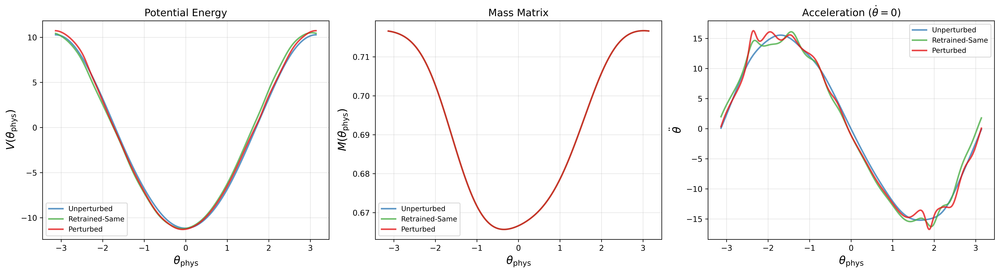

In [31]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5), dpi=DPI)

labels = ['Unperturbed', 'Retrained-Same', 'Perturbed']
colors = ['#377eb8', '#4daf4a', '#e41a1c']
data   = [phys_unpert, phys_same, phys_pert]

for i, (key, ylabel, title) in enumerate([
    ('V',   r'$V(\theta_{\mathrm{phys}})$',          'Potential Energy'),
    ('M',   r'$M(\theta_{\mathrm{phys}})$',          'Mass Matrix'),
    ('acc', r'$\ddot{\theta}$',  r'Acceleration ($\dot{\theta}=0$)'),
]):
    for d, label, c in zip(data, labels, colors):
        axes[i].plot(theta_phys_sorted, d[key][sort_idx], color=c, lw=2, label=label, alpha=0.8)
    axes[i].set_xlabel(r'$\theta_{\mathrm{phys}}$', fontsize=14)
    axes[i].set_ylabel(ylabel, fontsize=14)
    axes[i].set_title(title, fontsize=13)
    axes[i].legend(fontsize=9)
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

---
## 5. Case 1: Unperturbed — Validate Symbolic Form

The unperturbed pendulum has:
- $V(\phi) \approx A\cos(\phi) + C$ (gravity potential)
- $a(\phi) \approx -K\sin(\phi)$ where $K \approx \frac{3g}{2l}=14.7$

CASE 1a: PySR on Unperturbed V(φ)
Expected: V ~ A·cos(φ) + C


/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:1873: UserWarning: Note: Setting `random_state` without also setting `deterministic=True` and `parallelism='serial'` will result in non-deterministic searches.
  warnings.warn(
[ Info: Started!



Expressions evaluated per second: 2.810e+05
Progress: 588 / 3000 total iterations (19.600%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           5.724e+01  0.000e+00  y = -0.87356
2           4.991e+01  1.370e-01  y = sin(theta)
3           4.289e+01  1.515e-01  y = 2.2685 - theta
4           2.104e+01  7.125e-01  y = sin(theta) * 8.6073
6           8.944e-01  1.579e+00  y = sin(theta + 0.6349) * 10.69
8           1.091e-01  1.052e+00  y = (sin(theta + 0.63516) * 10.693) + -0.88614
10          6.990e-02  2.227e-01  y = -0.7813 - (sin((theta + 0.70726) * 0.98321) * -10.672)
11          5.239e-02  2.883e-01  y = ((sin(theta) + 10.694) * sin(theta + 0.63655)) - 1.287...
                                      4
12          4.074e-02  2.516e-01  y = ((sin(sin(theta)) + 10.693) * sin(38.335 +

[ Info: Final population:
[ Info: Results saved to:


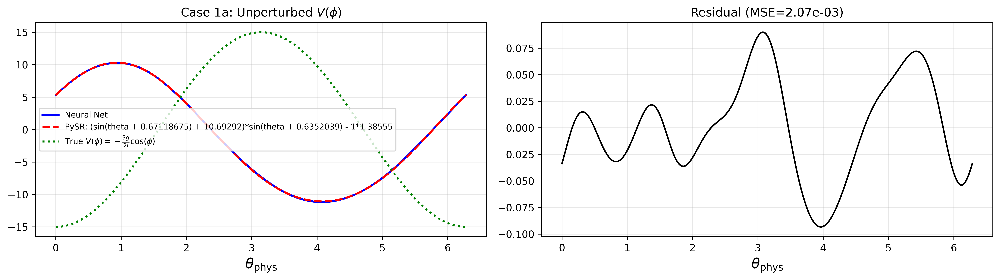


  V(φ) = (sin(theta + 0.67118675) + 10.69292)*sin(theta + 0.6352039) - 1*1.38555
  - /var/folders/5x/4lk3vhs53hq_qw_z1p9yk48m0000gn/T/tmpq_k7t3dh/20260302_232219_rH2mY1/hall_of_fame.csv


In [32]:

g= 10
l = 1

true_V_unpert = -(3 * g / (2 * l)) * np.cos(theta_range)


# Prepare fitting data (optionally restricted to PYSR_FIT range)
mask = (theta_range >= PYSR_FIT_MIN) & (theta_range <= PYSR_FIT_MAX)
X_fit = theta_range[mask].reshape(-1, 1)

print("=" * 60)
print("CASE 1a: PySR on Unperturbed V(φ)")
print("Expected: V ~ A·cos(φ) + C")
print("=" * 60)

_, _, expr_V1, pred_V1 = run_pysr(
    X_fit, phys_unpert['V'][mask],
    perturbation_type='trigonometric',
    niterations=PYSR_NITERATIONS, maxsize=PYSR_MAXSIZE)

# Predict on full range for plotting
pred_V1_full = np.interp(theta_range, theta_range[mask], pred_V1)
plot_fit(theta_range, phys_unpert['V'], pred_V1_full, expr_V1,
         r'Case 1a: Unperturbed $V(\phi)$',
         y_ref=true_V_unpert,
         ref_label=r'True $V(\phi) = -\frac{3g}{2l}\cos(\phi)$')
print(f"\n  V(φ) = {expr_V1}")

CASE 1b: PySR on Unperturbed a(φ)
Expected: a ~ -K·sin(φ)

Expressions evaluated per second: 2.730e+05
Progress: 552 / 3000 total iterations (18.400%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           1.200e+02  0.000e+00  y = 0.0023726
2           1.113e+02  7.471e-02  y = sin(theta)
3           1.054e+02  5.478e-02  y = 3.1443 - theta
4           4.238e+01  9.110e-01  y = cos(theta) * -12.445
6           5.606e-01  2.163e+00  y = cos(theta - -13.201) * -15.45
8           5.447e-01  1.434e-02  y = sin((theta + -0.92532) * 0.99325) * 15.467
9           3.520e-01  4.366e-01  y = cos(theta - -63.466) * (-15.45 - sin(theta))
11          7.902e-02  7.470e-01  y = (cos(-0.63439 - theta) * -15.447) - cos(theta + theta)
13          3.929e-02  3.494e-01  y = (cos(-0.63439 - theta) * -15.447)

/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:1873: UserWarning: Note: Setting `random_state` without also setting `deterministic=True` and `parallelism='serial'` will result in non-deterministic searches.
  warnings.warn(
[ Info: Started!
[ Info: Final population:
[ Info: Results saved to:


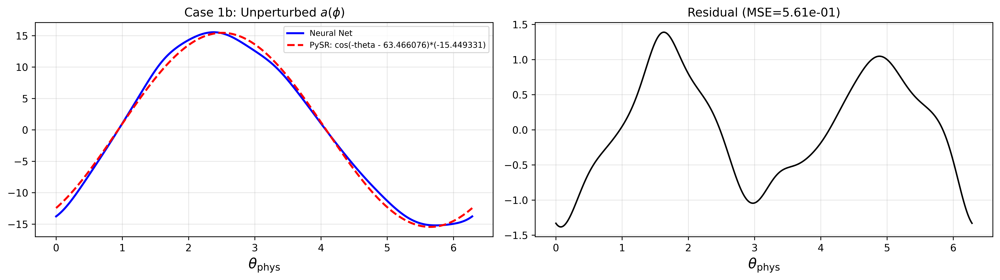


  a(φ) = cos(-theta - 63.466076)*(-15.449331)
  - /var/folders/5x/4lk3vhs53hq_qw_z1p9yk48m0000gn/T/tmp3l3bymdt/20260302_232246_VZzZv4/hall_of_fame.csv


In [33]:
print("=" * 60)
print("CASE 1b: PySR on Unperturbed a(φ)")
print("Expected: a ~ -K·sin(φ)")
print("=" * 60)

_, _, expr_a1, pred_a1 = run_pysr(
    X_fit, phys_unpert['acc'][mask],
    perturbation_type='trigonometric',
    niterations=PYSR_NITERATIONS, maxsize=PYSR_MAXSIZE)

pred_a1_full = np.interp(theta_range, theta_range[mask], pred_a1)
plot_fit(theta_range, phys_unpert['acc'], pred_a1_full, expr_a1,
         r'Case 1b: Unperturbed $a(\phi)$')
print(f"\n  a(φ) = {expr_a1}")

---
## 6. Case 2: Retrained-Same — Verify No Perturbation

This model was retrained with **frozen encoder/decoder on the same unperturbed data**.
The symbolic expressions should be identical to Case 1.

CASE 2a: PySR on Retrained-Same V(φ)
Expected: Same as Case 1a

Expressions evaluated per second: 2.670e+05
Progress: 505 / 3000 total iterations (16.833%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           5.880e+01  0.000e+00  y = -0.75713
2           5.163e+01  1.301e-01  y = sin(theta)
3           4.510e+01  1.352e-01  y = 2.3844 - theta
4           2.531e+01  5.778e-01  y = sin(theta) * 8.2629
6           6.982e-01  1.795e+00  y = cos(theta + -0.86734) * 10.835
8           1.036e-01  9.538e-01  y = (sin(theta + -24.429) * 10.837) + -0.77111
10          4.840e-02  3.808e-01  y = (sin((theta * 0.97951) + 0.77802) * 10.827) + -0.62336
13          1.085e-02  4.983e-01  y = (sin(theta + 0.86582) + 10.951) * (sin(theta - -0.7053...
                                      8) + -0.11549)
1

/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:1873: UserWarning: Note: Setting `random_state` without also setting `deterministic=True` and `parallelism='serial'` will result in non-deterministic searches.
  warnings.warn(
[ Info: Started!
[ Info: Final population:
[ Info: Results saved to:


  Selected complexity 6 (max score)
  Expression: sin(theta + 13.269835)*10.834828


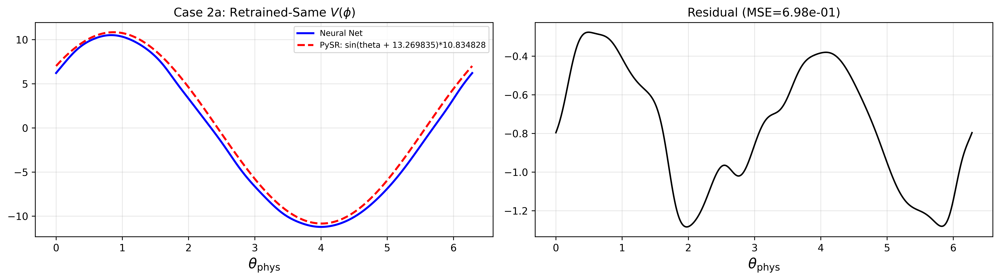


  V(φ) = sin(theta + 13.269835)*10.834828
  - /var/folders/5x/4lk3vhs53hq_qw_z1p9yk48m0000gn/T/tmpakspb45c/20260302_232312_TpKOHB/hall_of_fame.csv


In [34]:
print("=" * 60)
print("CASE 2a: PySR on Retrained-Same V(φ)")
print("Expected: Same as Case 1a")
print("=" * 60)

_, _, expr_V2, pred_V2 = run_pysr(
    X_fit, phys_same['V'][mask],
    perturbation_type='trigonometric',
    niterations=PYSR_NITERATIONS, maxsize=PYSR_MAXSIZE)

pred_V2_full = np.interp(theta_range, theta_range[mask], pred_V2)
plot_fit(theta_range, phys_same['V'], pred_V2_full, expr_V2,
         r'Case 2a: Retrained-Same $V(\phi)$')
print(f"\n  V(φ) = {expr_V2}")

CASE 2b: PySR on Retrained-Same a(φ)
Expected: Same as Case 1b

Expressions evaluated per second: 2.920e+05
Progress: 602 / 3000 total iterations (20.067%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           1.235e+02  0.000e+00  y = -0.015262
2           1.139e+02  8.088e-02  y = sin(theta)
3           1.067e+02  6.588e-02  y = 3.1271 - theta
4           5.197e+01  7.189e-01  y = cos(theta) * -11.95
6           9.001e-01  2.028e+00  y = sin(theta - -11.698) * 15.657
8           8.460e-01  3.100e-02  y = cos((theta * -0.98798) + 2.4077) * 15.677
9           8.072e-01  4.694e-02  y = sin(theta - 0.86829) * (cos(theta) + 15.655)
10          8.004e-01  8.439e-03  y = (sin(cos(theta)) - -15.655) * sin(-14.84 - theta)
11          5.638e-01  3.505e-01  y = (sin(theta - -0.79523) - -15.656) *

/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:1873: UserWarning: Note: Setting `random_state` without also setting `deterministic=True` and `parallelism='serial'` will result in non-deterministic searches.
  warnings.warn(
[ Info: Started!
[ Info: Final population:
[ Info: Results saved to:


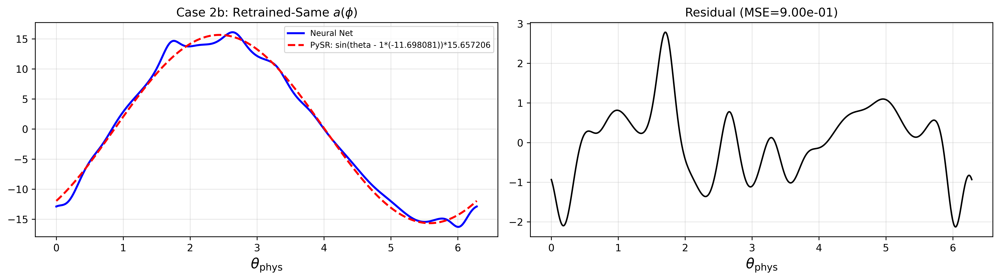


  a(φ) = sin(theta - 1*(-11.698081))*15.657206
  - /var/folders/5x/4lk3vhs53hq_qw_z1p9yk48m0000gn/T/tmp7hq_xbh4/20260302_232341_S8ffzT/hall_of_fame.csv


In [35]:
print("=" * 60)
print("CASE 2b: PySR on Retrained-Same a(φ)")
print("Expected: Same as Case 1b")
print("=" * 60)

_, _, expr_a2, pred_a2 = run_pysr(
    X_fit, phys_same['acc'][mask],
    perturbation_type='trigonometric',
    niterations=PYSR_NITERATIONS, maxsize=PYSR_MAXSIZE)

pred_a2_full = np.interp(theta_range, theta_range[mask], pred_a2)
plot_fit(theta_range, phys_same['acc'], pred_a2_full, expr_a2,
         r'Case 2b: Retrained-Same $a(\phi)$')
print(f"\n  a(φ) = {expr_a2}")

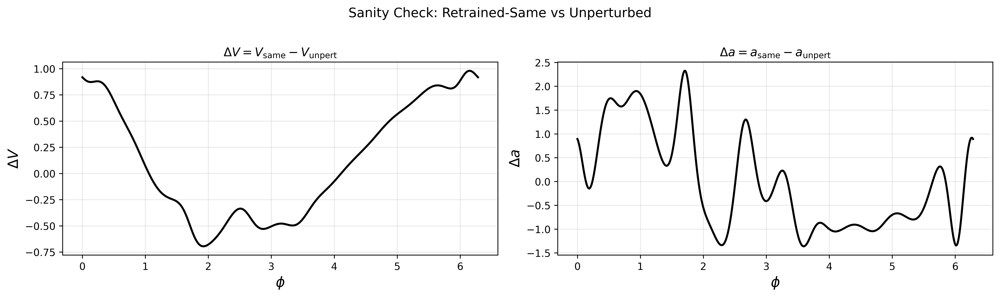

Max |Δ V|: 0.979914
Max |Δ a|: 2.324861
MSE(Δ a):  1.04610634



In [36]:
# Sanity check: Case 1 vs Case 2 should show ~zero difference
delta_a_check = phys_same['acc'] - phys_unpert['acc']
delta_V_check = phys_same['V']   - phys_unpert['V']

fig, axes = plt.subplots(1, 2, figsize=(14, 4), dpi=DPI)

axes[0].plot(theta_range, delta_V_check, 'k-', lw=2)
axes[0].set_title(r'$\Delta V = V_{\mathrm{same}} - V_{\mathrm{unpert}}$')
axes[0].set_xlabel(r'$\phi$', fontsize=14)
axes[0].set_ylabel(r'$\Delta V$', fontsize=14)
axes[0].grid(True, alpha=0.3)

axes[1].plot(theta_range, delta_a_check, 'k-', lw=2)
axes[1].set_title(r'$\Delta a = a_{\mathrm{same}} - a_{\mathrm{unpert}}$')
axes[1].set_xlabel(r'$\phi$', fontsize=14)
axes[1].set_ylabel(r'$\Delta a$', fontsize=14)
axes[1].grid(True, alpha=0.3)

plt.suptitle('Sanity Check: Retrained-Same vs Unperturbed', fontsize=13, y=1.02)
plt.tight_layout()
plt.show()

print(f"Max |Δ V|: {np.max(np.abs(delta_V_check)):.6f}")
print(f"Max |Δ a|: {np.max(np.abs(delta_a_check)):.6f}")
print(f"MSE(Δ a):  {np.mean(delta_a_check**2):.8f}")

if np.max(np.abs(delta_a_check)) < 1.0:
    print("\nSanity check PASSED: retraining on same data introduced no significant perturbation.")
else:
    print("\nWARNING: non-trivial difference detected. Check model convergence.")

---
## 7. Case 3: Perturbed Model

This model was retrained with **frozen encoder/decoder on perturbed data**.
The V_net has learned to absorb the perturbation. The symbolic form should
include additional terms beyond $\cos(\phi)$.

CASE 3a: PySR on Perturbed V(φ)
Expected: V ~ A·cos(φ) + perturbation terms
  Using combined operators: binary=['+', '*', '-'], unary=['sin', 'cos']

Expressions evaluated per second: 2.470e+05
Progress: 526 / 3000 total iterations (17.533%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           5.973e+01  0.000e+00  y = -0.79195
2           5.226e+01  1.336e-01  y = sin(theta)
3           4.534e+01  1.420e-01  y = 2.3501 - theta
4           2.336e+01  6.633e-01  y = sin(theta) * 8.6105
6           8.270e-01  1.670e+00  y = cos(theta + -26.042) * 10.914
8           1.783e-01  7.672e-01  y = (cos(theta + -0.90887) * 10.916) + -0.80538
10          1.351e-01  1.388e-01  y = ((theta * -0.023634) + cos(theta + -0.87982)) * 10.528
11          3.745e-02  1.283e+00  y = ((sin(theta) + 10.907) * c

/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:1873: UserWarning: Note: Setting `random_state` without also setting `deterministic=True` and `parallelism='serial'` will result in non-deterministic searches.
  warnings.warn(
[ Info: Started!



Expressions evaluated per second: 2.670e+05
Progress: 1044 / 3000 total iterations (34.800%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           5.973e+01  0.000e+00  y = -0.79195
2           5.226e+01  1.336e-01  y = sin(theta)
3           4.534e+01  1.420e-01  y = 2.3501 - theta
4           2.336e+01  6.633e-01  y = sin(theta) * 8.6105
6           8.270e-01  1.670e+00  y = cos(theta + -26.042) * 10.914
8           1.783e-01  7.672e-01  y = (cos(theta + -0.90887) * 10.916) + -0.80538
10          1.351e-01  1.388e-01  y = (theta * -0.2488) + (cos(theta + -0.87983) * 10.528)
11          3.730e-02  1.287e+00  y = (cos(theta + -0.90787) * (sin(theta) + 10.917)) - 1.19...
                                      88
13          1.685e-02  3.974e-01  y = ((sin(theta + 0.38054) + 10.916) * cos(

[ Info: Final population:
[ Info: Results saved to:


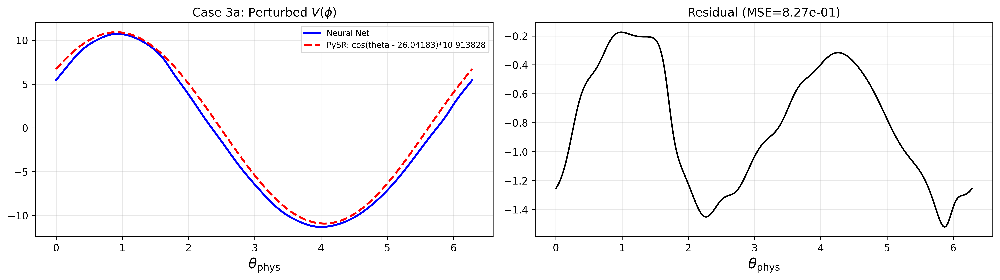


  V(φ) = cos(theta - 26.04183)*10.913828
  - /var/folders/5x/4lk3vhs53hq_qw_z1p9yk48m0000gn/T/tmpq9ebro02/20260302_232412_TpKOHB/hall_of_fame.csv


In [37]:
print("=" * 60)
print("CASE 3a: PySR on Perturbed V(φ)")
print("Expected: V ~ A·cos(φ) + perturbation terms")
print("=" * 60)

# Combine trig (for base physics) + user's perturbation hint
combined_ops = get_combined_operators(PERTURBATION_TYPE)
print(f"  Using combined operators: binary={combined_ops['binary']}, unary={combined_ops['unary']}")

_, _, expr_V3, pred_V3 = run_pysr(
    X_fit, phys_pert['V'][mask],
    operators=combined_ops,
    niterations=PYSR_NITERATIONS, maxsize=PYSR_MAXSIZE)

pred_V3_full = np.interp(theta_range, theta_range[mask], pred_V3)
plot_fit(theta_range, phys_pert['V'], pred_V3_full, expr_V3,
         r'Case 3a: Perturbed $V(\phi)$')
print(f"\n  V(φ) = {expr_V3}")

CASE 3b: PySR on Perturbed a(φ)
Expected: a ~ -K·sin(φ) + perturbation polynomial
  Using combined operators: binary=['+', '*', '-'], unary=['sin', 'cos']

Expressions evaluated per second: 2.630e+05
Progress: 527 / 3000 total iterations (17.567%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           1.260e+02  0.000e+00  y = -0.0043266
2           1.168e+02  7.558e-02  y = sin(theta)
3           1.111e+02  4.950e-02  y = 3.1382 - theta
4           4.844e+01  8.304e-01  y = cos(theta) * -12.438
6           1.607e+00  1.703e+00  y = sin(theta - -30.507) * 15.766
7           1.488e+00  7.693e-02  y = sin(sin(theta + -19.76)) * 17.904
9           1.173e+00  1.189e-01  y = sin(theta - -30.507) * (sin(theta) - -15.766)
10          1.070e+00  9.218e-02  y = sin(sin(theta - 0.91064)) * (sin(the

/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:1873: UserWarning: Note: Setting `random_state` without also setting `deterministic=True` and `parallelism='serial'` will result in non-deterministic searches.
  warnings.warn(
[ Info: Started!
[ Info: Final population:
[ Info: Results saved to:


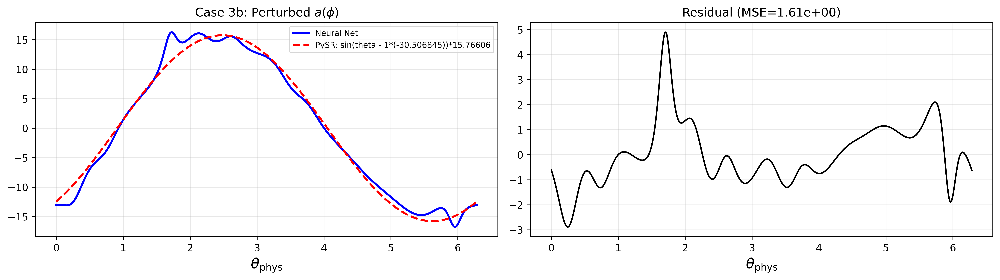


  a(φ) = sin(theta - 1*(-30.506845))*15.76606
  - /var/folders/5x/4lk3vhs53hq_qw_z1p9yk48m0000gn/T/tmpcubb2ovo/20260302_232441_TpKOHB/hall_of_fame.csv


In [38]:
print("=" * 60)
print("CASE 3b: PySR on Perturbed a(φ)")
print("Expected: a ~ -K·sin(φ) + perturbation polynomial")
print("=" * 60)

# Same combined operators: trig + perturbation hint
combined_ops = get_combined_operators(PERTURBATION_TYPE)
print(f"  Using combined operators: binary={combined_ops['binary']}, unary={combined_ops['unary']}")

_, _, expr_a3, pred_a3 = run_pysr(
    X_fit, phys_pert['acc'][mask],
    operators=combined_ops,
    niterations=PYSR_NITERATIONS, maxsize=PYSR_MAXSIZE)

pred_a3_full = np.interp(theta_range, theta_range[mask], pred_a3)
plot_fit(theta_range, phys_pert['acc'], pred_a3_full, expr_a3,
         r'Case 3b: Perturbed $a(\phi)$')
print(f"\n  a(φ) = {expr_a3}")

---
## 8. Perturbation Detection — Acceleration Space (Fixed Coordinates)

Compute $\Delta a = a_{\mathrm{perturbed}} - a_{\mathrm{unperturbed}}$ and fit with PySR
**in physical coordinates** $\theta_{\mathrm{phys}} \in [-\pi, \pi]$.

The phase offset calibration from Section 3b ensures PySR sees the perturbation
as a clean polynomial in $\theta_{\mathrm{phys}}$, not a shifted one in $\phi$.

Expected: $\Delta a \approx -\alpha_1 \theta - \alpha_2 \theta^2 - \alpha_3 \theta^3$

PERTURBATION DETECTION: Acceleration Space (Fixed Coords)
Operator hint: 'polynomial'

Expressions evaluated per second: 1.580e+05
Progress: 380 / 9000 total iterations (4.222%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           8.640e-01  0.000e+00  y = -0.0065428
3           7.823e-01  4.964e-02  y = theta * -0.15745
5           7.823e-01  2.024e-05  y = (theta - -0.035617) * -0.1575
7           7.635e-01  1.213e-02  y = theta * ((theta * 0.031046) + -0.15784)
9           7.373e-01  1.747e-02  y = (theta * ((theta * 0.072118) + -0.15786)) + -0.24311
───────────────────────────────────────────────────────────────────────────────────────────────────
════════════════════════════════════════════════════════════════════════════════════════════════════
Press 'q' and then <enter> to stop e

/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:1873: UserWarning: Note: Setting `random_state` without also setting `deterministic=True` and `parallelism='serial'` will result in non-deterministic searches.
  warnings.warn(
[ Info: Started!



Expressions evaluated per second: 1.980e+05
Progress: 999 / 9000 total iterations (11.100%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           8.640e-01  0.000e+00  y = -0.0065428
3           7.823e-01  4.964e-02  y = theta * -0.15745
5           7.823e-01  2.024e-05  y = (theta - -0.035617) * -0.1575
7           7.635e-01  1.213e-02  y = theta * ((theta * 0.031046) + -0.15784)
9           7.373e-01  1.747e-02  y = (theta * ((theta * 0.072118) + -0.15786)) + -0.24311
13          7.373e-01  -0.000e+00  y = ((theta * ((theta * 0.072118) + -1.1579)) + (theta + ...
                                       -0.4976)) + 0.25449
15          7.291e-01  5.603e-03  y = ((((theta * 0.010483) * theta) - 0.10539) * theta) * (...
                                      (theta + -0.64031) * theta)
17   

[ Info: Final population:
[ Info: Results saved to:


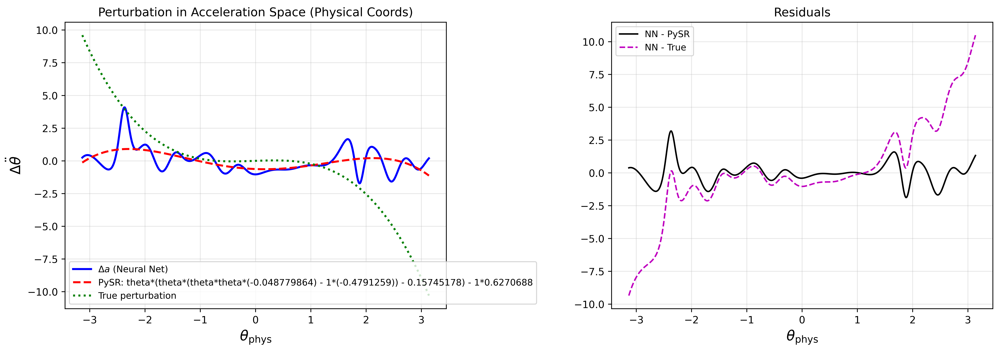


Recovered perturbation (acceleration): Δa(θ) = theta*(theta*(theta*theta*(-0.048779864) - 1*(-0.4791259)) - 0.15745178) - 1*0.6270688

PySR equation table:
   complexity      loss                                                                                                                  equation
0           1  0.863978                                                                                                              -0.006542778
1           3  0.782328                                                                                                       theta * -0.15745178
2           5  0.782296                                                                                      (theta - -0.035617437) * -0.15749647
3           7  0.763548                                                                            theta * (-0.15784371 - (theta * -0.031041637))
4           9  0.737329                                                             (((theta * 0.072117485) + -0.

In [39]:
print("=" * 60)
print("PERTURBATION DETECTION: Acceleration Space (Fixed Coords)")
print(f"Operator hint: '{PERTURBATION_TYPE}'")
print("=" * 60)

# Use pre-computed sorted physical coordinates from Section 3c
# delta_a_sorted and theta_phys_sorted are already available

# Ground truth
true_delta_a = -ALPHA1 * theta_phys_sorted - ALPHA2 * theta_phys_sorted**2 - ALPHA3 * theta_phys_sorted**3

# PySR fit in physical coordinates
X_fit_phys = theta_phys_sorted.reshape(-1, 1)

sr_delta_a, idx_da, expr_delta_a, pred_delta_a = run_pysr(
    X_fit_phys, delta_a_sorted,
    perturbation_type=PERTURBATION_TYPE,
    niterations=300, maxsize=20,
    variable_name='theta')

# Plot with ground truth
fig, axes = plt.subplots(1, 2, figsize=(14, 5), dpi=DPI)

axes[0].plot(theta_phys_sorted, delta_a_sorted, 'b-', lw=2, label=r'$\Delta a$ (Neural Net)')
axes[0].plot(theta_phys_sorted, pred_delta_a, 'r--', lw=2,
             label=f'PySR: {expr_delta_a}')
axes[0].plot(theta_phys_sorted, true_delta_a, 'g:', lw=2, label='True perturbation')
axes[0].set_xlabel(r'$\theta_{\mathrm{phys}}$', fontsize=14)
axes[0].set_ylabel(r'$\Delta \ddot{\theta}$', fontsize=14)
axes[0].set_title('Perturbation in Acceleration Space (Physical Coords)')
axes[0].legend(fontsize=9)
axes[0].grid(True, alpha=0.3)

axes[1].plot(theta_phys_sorted, delta_a_sorted - pred_delta_a, 'k-', lw=1.5,
             label='NN - PySR')
axes[1].plot(theta_phys_sorted, delta_a_sorted - true_delta_a, 'm--', lw=1.5,
             label='NN - True')
axes[1].set_xlabel(r'$\theta_{\mathrm{phys}}$', fontsize=14)
axes[1].set_title('Residuals')
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nRecovered perturbation (acceleration): Δa(θ) = {expr_delta_a}")
print(f"\nPySR equation table:")
print(sr_delta_a.equations_[['complexity', 'loss', 'equation']].to_string())

---
## 9. Perturbation Detection — Potential Space (Fixed Coordinates)

Compute $\Delta V = V_{\mathrm{perturbed}} - V_{\mathrm{unperturbed}}$ in physical coordinates.

Expected: $\Delta V \propto \frac{\alpha_1}{2}\theta^2 + \frac{\alpha_2}{3}\theta^3 + \frac{\alpha_3}{4}\theta^4$

PERTURBATION DETECTION: Potential Space (Fixed Coords)
Operator hint: 'polynomial'
Using M_scale = 0.6915 for ground truth comparison

Expressions evaluated per second: 2.560e+05
Progress: 510 / 9000 total iterations (5.667%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           9.036e-02  0.000e+00  y = -0.07611
3           8.288e-02  4.321e-02  y = theta * 0.063489
5           7.703e-02  3.660e-02  y = (theta - 1.2021) * 0.063626
7           6.133e-02  1.140e-01  y = ((theta * 0.057944) * theta) + -0.26692
9           4.812e-02  1.213e-01  y = (1.6695 - theta) * (-0.15987 - (0.057823 * theta))
11          4.812e-02  2.980e-07  y = ((((theta + 0.059875) * 1.0578) - theta) * theta) + -0...
                                      .26689
13          1.797e-02  4.924e-01  y = ((((theta + -1.5

/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysr/sr.py:1873: UserWarning: Note: Setting `random_state` without also setting `deterministic=True` and `parallelism='serial'` will result in non-deterministic searches.
  warnings.warn(
[ Info: Started!


Progress: 1126 / 9000 total iterations (12.511%)
════════════════════════════════════════════════════════════════════════════════════════════════════
───────────────────────────────────────────────────────────────────────────────────────────────────
Complexity  Loss       Score      Equation
1           9.036e-02  0.000e+00  y = -0.07611
3           8.288e-02  4.321e-02  y = theta * 0.063489
5           7.703e-02  3.660e-02  y = (theta - 1.2021) * 0.063626
7           6.133e-02  1.140e-01  y = ((theta * 0.057944) * theta) + -0.26692
9           4.812e-02  1.213e-01  y = (1.6695 - theta) * (-0.15987 - (0.057823 * theta))
11          3.906e-02  1.043e-01  y = ((theta * (theta * -0.037054)) - -0.28265) * (theta - ...
                                      0.26733)
13          1.797e-02  3.880e-01  y = ((((theta + -1.5644) * (theta * -0.037054)) - -0.28265...
                                      ) * theta) - 0.26733
15          1.797e-02  8.345e-07  y = (((2.089 + theta) * ((0.96293 * (the

[ Info: Final population:
[ Info: Results saved to:


  Selected complexity 19 (max score)
  Expression: theta*(theta*theta*(theta*(theta*0.008857759 + 0.006614457) - 0.13427672) - 1*(-0.48878872)) - 0.20526356


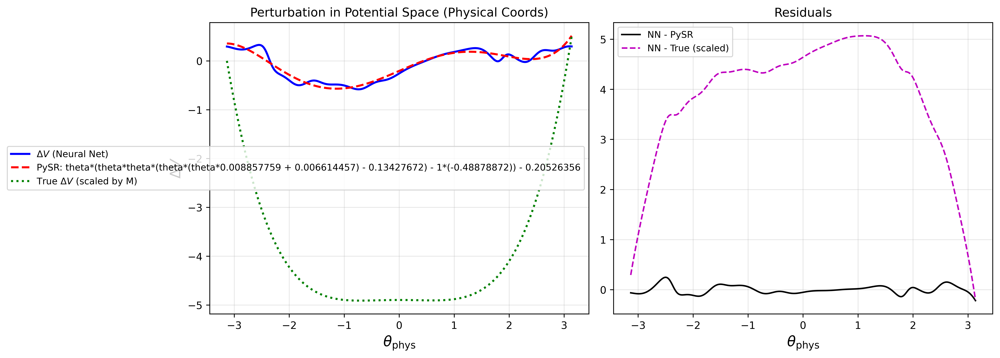


Recovered perturbation (potential): ΔV(θ) = theta*(theta*theta*(theta*(theta*0.008857759 + 0.006614457) - 0.13427672) - 1*(-0.48878872)) - 0.20526356

PySR equation table:
   complexity      loss                                                                                                                     equation
0           1  0.090359                                                                                                                   -0.0761104
1           3  0.082877                                                                                                           theta * 0.06348935
2           5  0.077028                                                                                            (theta - 1.2020956) * 0.063626036
3           7  0.061330                                                                                ((theta * 0.057943713) * theta) + -0.26691955
4           9  0.048120                                                           

In [40]:
print("=" * 60)
print("PERTURBATION DETECTION: Potential Space (Fixed Coords)")
print(f"Operator hint: '{PERTURBATION_TYPE}'")
print("=" * 60)

# Align potentials and compute ΔV, then sort to physical coords
V_unpert_aligned = phys_unpert['V'] - phys_unpert['V'][0]
V_pert_aligned   = phys_pert['V']   - phys_pert['V'][0]
delta_V = V_pert_aligned - V_unpert_aligned
delta_V_sorted = delta_V[sort_idx]

# Ground truth in physical coordinates
M_scale = np.mean(phys_pert['M'])
true_delta_V_raw = M_scale * (
    (ALPHA1/2) * theta_phys_sorted**2 +
    (ALPHA2/3) * theta_phys_sorted**3 +
    (ALPHA3/4) * theta_phys_sorted**4
)
true_delta_V = true_delta_V_raw - true_delta_V_raw[0]
print(f"Using M_scale = {M_scale:.4f} for ground truth comparison")

# PySR fit in physical coordinates
X_fit_phys = theta_phys_sorted.reshape(-1, 1)

sr_delta_V, idx_dV, expr_delta_V, pred_delta_V = run_pysr(
    X_fit_phys, delta_V_sorted,
    perturbation_type=PERTURBATION_TYPE,
    niterations=300, maxsize=20,
    variable_name='theta')

# Plot
fig, axes = plt.subplots(1, 2, figsize=(14, 5), dpi=DPI)

axes[0].plot(theta_phys_sorted, delta_V_sorted, 'b-', lw=2, label=r'$\Delta V$ (Neural Net)')
axes[0].plot(theta_phys_sorted, pred_delta_V, 'r--', lw=2,
             label=f'PySR: {expr_delta_V}')
axes[0].plot(theta_phys_sorted, true_delta_V, 'g:', lw=2, label=r'True $\Delta V$ (scaled by M)')
axes[0].set_xlabel(r'$\theta_{\mathrm{phys}}$', fontsize=14)
axes[0].set_ylabel(r'$\Delta V$', fontsize=14)
axes[0].set_title('Perturbation in Potential Space (Physical Coords)')
axes[0].legend(fontsize=9)
axes[0].grid(True, alpha=0.3)

axes[1].plot(theta_phys_sorted, delta_V_sorted - pred_delta_V, 'k-', lw=1.5,
             label='NN - PySR')
axes[1].plot(theta_phys_sorted, delta_V_sorted - true_delta_V, 'm--', lw=1.5,
             label='NN - True (scaled)')
axes[1].set_xlabel(r'$\theta_{\mathrm{phys}}$', fontsize=14)
axes[1].set_title('Residuals')
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nRecovered perturbation (potential): ΔV(θ) = {expr_delta_V}")
print(f"\nPySR equation table:")
print(sr_delta_V.equations_[['complexity', 'loss', 'equation']].to_string())

---
## 10. Summary Report

In [41]:
print("=" * 70)
print("     SYMBOLIC PERTURBATION DETECTION REPORT (Fixed Coords)")
print("=" * 70)

print("\n--- Phase Offset Calibration ---")
print(f"  Mapping: θ_phys = {calib['sign']:+.0f} * (φ + {calib['offset']:.4f})")
print(f"  Base physics fit MSE: {calib['mse']:.4f}")
print(f"  Amplitude: {calib['amplitude']:.2f} (expected: {calib['expected_amplitude']:.2f})")

print("\n--- Polynomial Regression Diagnostic ---")
coeffs3 = np.polyfit(theta_phys_sorted, delta_a_sorted, 3)
poly3_pred = np.polyval(coeffs3, theta_phys_sorted)
r2_poly3 = 1 - np.sum((delta_a_sorted - poly3_pred)**2) / np.sum((delta_a_sorted - np.mean(delta_a_sorted))**2)
print(f"  Degree-3 R² = {r2_poly3:.4f}")
print(f"  Fitted:  {coeffs3[0]:+.4f}·θ³ {coeffs3[1]:+.4f}·θ² {coeffs3[2]:+.4f}·θ {coeffs3[3]:+.4f}")
print(f"  True:    {-ALPHA3:+.4f}·θ³ {-ALPHA2:+.4f}·θ² {-ALPHA1:+.4f}·θ  +0.0000")

print("\n--- Recovered Perturbation (Physical Coordinates) ---")

# Expand PySR results to polynomial form for easy comparison
import sympy as sp
theta_sym = sp.Symbol('theta')

print("\n  Acceleration space Pareto front:")
eqs_a = sr_delta_a.equations_
for row_idx in range(len(eqs_a)):
    cx = int(eqs_a.iloc[row_idx]['complexity'])
    loss = float(eqs_a.iloc[row_idx]['loss'])
    expr = sr_delta_a.sympy(index=eqs_a.index[row_idx])
    try:
        expanded = sp.expand(expr)
        poly = sp.Poly(expanded, theta_sym)
        coeffs = {m[0]: float(c) for m, c in poly.as_dict().items()}
        max_d = max(coeffs.keys()) if coeffs else 0
        terms = []
        for d in range(max_d + 1):
            c = coeffs.get(d, 0)
            if abs(c) > 1e-8:
                terms.append(f"{c:+.4f}·θ^{d}")
        print(f"    cx={cx:2d}  loss={loss:8.3f}  {' '.join(terms)}")
    except:
        print(f"    cx={cx:2d}  loss={loss:8.3f}  {expr}")

print(f"\n    TRUE:                       +0.1443·θ^1  -0.0339·θ^2  -0.3375·θ^3")

print("\n  Potential space Pareto front:")
eqs_V = sr_delta_V.equations_
for row_idx in range(len(eqs_V)):
    cx = int(eqs_V.iloc[row_idx]['complexity'])
    loss = float(eqs_V.iloc[row_idx]['loss'])
    expr = sr_delta_V.sympy(index=eqs_V.index[row_idx])
    try:
        expanded = sp.expand(expr)
        poly = sp.Poly(expanded, theta_sym)
        coeffs = {m[0]: float(c) for m, c in poly.as_dict().items()}
        max_d = max(coeffs.keys()) if coeffs else 0
        terms = []
        for d in range(max_d + 1):
            c = coeffs.get(d, 0)
            if abs(c) > 1e-8:
                terms.append(f"{c:+.4f}·θ^{d}")
        print(f"    cx={cx:2d}  loss={loss:8.3f}  {' '.join(terms)}")
    except:
        print(f"    cx={cx:2d}  loss={loss:8.3f}  {expr}")

M_sc = np.mean(phys_pert['M'])
print(f"\n    TRUE (×M={M_sc:.4f}):          {M_sc*ALPHA1/2:+.4f}·θ^2  {M_sc*ALPHA2/3:+.4f}·θ^3  {M_sc*ALPHA3/4:+.4f}·θ^4")

print("\n--- Ground Truth ---")
print(f"  Δa = {-ALPHA1:.4f}·θ - {ALPHA2:.4f}·θ² - {ALPHA3:.4f}·θ³")
print(f"  alpha1={ALPHA1:.4f}, alpha2={ALPHA2:.4f}, alpha3={ALPHA3:.4f}")

print("\n--- Settings Used ---")
print(f"  Perturbation type hint: {PERTURBATION_TYPE}")
print(f"  Coordinate: θ_phys ∈ [-π, π] (calibrated from NN angle)")
print(f"  PySR iterations: 300, max size: 20")
print("=" * 70)

     SYMBOLIC PERTURBATION DETECTION REPORT (Fixed Coords)

--- Phase Offset Calibration ---
  Mapping: θ_phys = +1 * (φ + 2.2050)
  Base physics fit MSE: 0.6618
  Amplitude: -15.45 (expected: -15.00)

--- Polynomial Regression Diagnostic ---
  Degree-3 R² = 0.1468
  Fitted:  +0.0029·θ³ +0.0721·θ² -0.1752·θ -0.2431
  True:    -0.3375·θ³ -0.0339·θ² +0.1443·θ  +0.0000

--- Recovered Perturbation (Physical Coordinates) ---

  Acceleration space Pareto front:
    cx= 1  loss=   0.864  -0.0065·θ^0
    cx= 3  loss=   0.782  -0.1575·θ^1
    cx= 5  loss=   0.782  -0.0056·θ^0 -0.1575·θ^1
    cx= 7  loss=   0.764  -0.1578·θ^1 +0.0310·θ^2
    cx= 9  loss=   0.737  -0.2431·θ^0 -0.1579·θ^1 +0.0721·θ^2
    cx=13  loss=   0.688  -0.6504·θ^0 +0.4840·θ^2 -0.0487·θ^4
    cx=15  loss=   0.607  -0.6271·θ^0 -0.1575·θ^1 +0.4791·θ^2 -0.0488·θ^4
    cx=17  loss=   0.606  -0.6507·θ^0 -0.1776·θ^1 +0.4846·θ^2 +0.0033·θ^3 -0.0488·θ^4
    cx=19  loss=   0.587  -0.6528·θ^0 +0.4846·θ^2 -0.0940·θ^3 -0.0487·θ^4 +0.009

---
## 10b. Expand PySR Expressions to Standard Polynomial Form

PySR returns factored/nested expressions. To compare with ground truth coefficients,
we expand each candidate into standard polynomial form $c_0 + c_1\theta + c_2\theta^2 + c_3\theta^3 + \ldots$
using sympy, then compare coefficient-by-coefficient.

In [42]:
import sympy as sp

theta_sym = sp.Symbol('theta')

def expand_to_poly_coeffs(expr_sympy, symbol, max_degree=5):
    """Expand a sympy expression into polynomial coefficients."""
    poly = sp.Poly(sp.expand(expr_sympy), symbol)
    coeffs = {}
    for monom, coeff in poly.as_dict().items():
        deg = monom[0]
        coeffs[deg] = float(coeff)
    return coeffs

def print_poly_comparison(label, expr_sympy, true_coeffs, symbol):
    """Print expanded polynomial vs ground truth."""
    expanded = sp.expand(expr_sympy)
    print(f"\n{'='*60}")
    print(f"  {label}")
    print(f"{'='*60}")
    print(f"  PySR (raw):      {expr_sympy}")
    print(f"  PySR (expanded): {expanded}")
    
    try:
        fitted_coeffs = expand_to_poly_coeffs(expr_sympy, symbol)
    except Exception as e:
        print(f"  (Cannot expand to polynomial: {e})")
        return
    
    max_deg = max(
        max(fitted_coeffs.keys()) if fitted_coeffs else 0,
        max(true_coeffs.keys()) if true_coeffs else 0
    )
    
    print(f"\n  {'Degree':<8} {'Fitted':>12} {'True':>12} {'Ratio':>10}")
    print(f"  {'-'*42}")
    for d in range(max_deg + 1):
        f = fitted_coeffs.get(d, 0.0)
        t = true_coeffs.get(d, 0.0)
        ratio = f"{f/t:.3f}" if abs(t) > 1e-6 else "---"
        print(f"  {d:<8} {f:>12.4f} {t:>12.4f} {ratio:>10}")

# Ground truth for Δa: -α₁θ - α₂θ² - α₃θ³
true_da_coeffs = {0: 0.0, 1: -ALPHA1, 2: -ALPHA2, 3: -ALPHA3}
# = {0: 0, 1: 0.1443, 2: -0.0339, 3: -0.3375}

# Ground truth for ΔV: (α₁/2)θ² + (α₂/3)θ³ + (α₃/4)θ⁴  (times M_scale)
M_scale = np.mean(phys_pert['M'])
true_dV_coeffs = {
    0: 0.0,
    1: 0.0,
    2: M_scale * ALPHA1/2,
    3: M_scale * ALPHA2/3,
    4: M_scale * ALPHA3/4,
}

print("ACCELERATION SPACE: Δa(θ)")
print("=" * 60)

eqs_a = sr_delta_a.equations_
for row_idx in range(len(eqs_a)):
    cx = int(eqs_a.iloc[row_idx]['complexity'])
    loss = float(eqs_a.iloc[row_idx]['loss'])
    expr = sr_delta_a.sympy(index=eqs_a.index[row_idx])
    try:
        coeffs = expand_to_poly_coeffs(expr, theta_sym)
        max_deg = max(coeffs.keys()) if coeffs else 0
        coeff_str = " + ".join(
            f"{coeffs.get(d, 0):+.4f}·θ^{d}" for d in range(max_deg + 1)
        )
        print(f"  cx={cx:2d}  loss={loss:.3f}  {coeff_str}")
    except:
        print(f"  cx={cx:2d}  loss={loss:.3f}  (non-polynomial: {expr})")

print(f"\n  TRUE:                 +0.1443·θ^1  -0.0339·θ^2  -0.3375·θ^3")

# Detailed comparison for the best cubic-like expression
print("\n\nBest candidate expressions (detailed):")
for row_idx in range(len(eqs_a)):
    cx = int(eqs_a.iloc[row_idx]['complexity'])
    if cx in [7, 9, 11, 13]:
        expr = sr_delta_a.sympy(index=eqs_a.index[row_idx])
        print_poly_comparison(
            f"Δa — complexity {cx} (loss={float(eqs_a.iloc[row_idx]['loss']):.3f})",
            expr, true_da_coeffs, theta_sym
        )

print("\n\n" + "=" * 60)
print("POTENTIAL SPACE: ΔV(θ)")
print("=" * 60)

eqs_V = sr_delta_V.equations_
for row_idx in range(len(eqs_V)):
    cx = int(eqs_V.iloc[row_idx]['complexity'])
    loss = float(eqs_V.iloc[row_idx]['loss'])
    expr = sr_delta_V.sympy(index=eqs_V.index[row_idx])
    try:
        coeffs = expand_to_poly_coeffs(expr, theta_sym)
        max_deg = max(coeffs.keys()) if coeffs else 0
        coeff_str = " + ".join(
            f"{coeffs.get(d, 0):+.4f}·θ^{d}" for d in range(max_deg + 1)
        )
        print(f"  cx={cx:2d}  loss={loss:.3f}  {coeff_str}")
    except:
        print(f"  cx={cx:2d}  loss={loss:.3f}  (non-polynomial: {expr})")

print(f"\n  TRUE (×M={M_scale:.4f}): {M_scale*ALPHA1/2:+.4f}·θ^2  {M_scale*ALPHA2/3:+.4f}·θ^3  {M_scale*ALPHA3/4:+.4f}·θ^4")

ACCELERATION SPACE: Δa(θ)
  cx= 1  loss=0.864  -0.0065·θ^0
  cx= 3  loss=0.782  +0.0000·θ^0 + -0.1575·θ^1
  cx= 5  loss=0.782  -0.0056·θ^0 + -0.1575·θ^1
  cx= 7  loss=0.764  +0.0000·θ^0 + -0.1578·θ^1 + +0.0310·θ^2
  cx= 9  loss=0.737  -0.2431·θ^0 + -0.1579·θ^1 + +0.0721·θ^2
  cx=13  loss=0.688  -0.6504·θ^0 + +0.0000·θ^1 + +0.4840·θ^2 + +0.0000·θ^3 + -0.0487·θ^4
  cx=15  loss=0.607  -0.6271·θ^0 + -0.1575·θ^1 + +0.4791·θ^2 + +0.0000·θ^3 + -0.0488·θ^4
  cx=17  loss=0.606  -0.6507·θ^0 + -0.1776·θ^1 + +0.4846·θ^2 + +0.0033·θ^3 + -0.0488·θ^4
  cx=19  loss=0.587  -0.6528·θ^0 + +0.0000·θ^1 + +0.4846·θ^2 + -0.0940·θ^3 + -0.0487·θ^4 + +0.0094·θ^5

  TRUE:                 +0.1443·θ^1  -0.0339·θ^2  -0.3375·θ^3


Best candidate expressions (detailed):

  Δa — complexity 7 (loss=0.764)
  PySR (raw):      theta*(-(-0.031041637)*theta - 0.15784371)
  PySR (expanded): 0.031041637*theta**2 - 0.15784371*theta

  Degree         Fitted         True      Ratio
  ------------------------------------------
  

---
## 11. SINDy: Sparse Identification of Nonlinear Dynamics

PySR searches over expression trees — powerful but stochastic and slow.
**SINDy** takes a fundamentally different approach: it builds a fixed library of
candidate basis functions (e.g., $1, \theta, \theta^2, \theta^3, \sin\theta, \cos\theta, \ldots$)
and uses **sparse regression** (STLSQ/LASSO) to find which terms are active and their coefficients.

This is naturally suited to our problem because:
- The perturbation is a **sparse linear combination** of known basis functions
- SINDy is deterministic and fast (no stochastic search)
- It handles noisy data via thresholding (small spurious coefficients get zeroed out)

We apply SINDy to both $\Delta a$ and $\Delta V$ in physical coordinates.

In [43]:
import pysindy as ps
from sklearn.linear_model import Lasso, Ridge

# ============================================================
# Build the basis library
# ============================================================
# Polynomial terms: 1, θ, θ², θ³, θ⁴, θ⁵
# Fourier/trig terms: sin(θ), cos(θ), sin(2θ), cos(2θ)
# This covers both the expected polynomial perturbation and
# any residual trig structure from imperfect NN subtraction.

poly_lib = ps.PolynomialLibrary(degree=5, include_bias=True)
fourier_lib = ps.FourierLibrary(n_frequencies=2)
combined_lib = poly_lib + fourier_lib

# Reshape for SINDy: expects (n_samples, n_features)
X_sindy = theta_phys_sorted.reshape(-1, 1)

print("SINDy basis library:")
combined_lib.fit(X_sindy)
print(f"  Features: {combined_lib.get_feature_names()}")
print(f"  Total basis functions: {len(combined_lib.get_feature_names())}")
print()

SINDy basis library:
  Features: ['1', 'x0', 'x0^2', 'x0^3', 'x0^4', 'x0^5', 'sin(1 x0)', 'cos(1 x0)', 'sin(2 x0)', 'cos(2 x0)']
  Total basis functions: 10



### 11a. SINDy on Δa (Acceleration Space)

We scan over STLSQ threshold values to find the sparsest model that still fits well.
Lower threshold = more terms retained; higher threshold = sparser model.

SINDy threshold scan for Δa

                 --- Combined (poly+trig) ---          --- Polynomial only ---
   Threshold  N_act       R²    N_act       R²
--------------------------------------------------
      0.0010    10  0.4399       6  0.3230
      0.0014    10  0.4399       6  0.3230
      0.0021    10  0.4399       6  0.3230
      0.0030    10  0.4399       6  0.3230
      0.0043    10  0.4399       6  0.3230
      0.0062    10  0.4399       6  0.3230
      0.0089    10  0.4399       6  0.3230
      0.0127    10  0.4399       4  0.2983
      0.0183    10  0.4399       4  0.2983
      0.0264    10  0.4399       4  0.2983
      0.0379    10  0.4399       4  0.2983
      0.0546    10  0.4399       3  0.1466
      0.0785    10  0.4399       1  0.0945
      0.1129    10  0.4399       0  -0.0000
      0.1624    10  0.4399       0  -0.0000
      0.2336    10  0.4399       0  -0.0000
      0.3360    10  0.4399       0  -0.0000
      0.4833    10  0.4399       0  -0.0000
      0.6952   

/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysindy/optimizers/stlsq.py:224: UserWarning: Sparsity parameter is too big (0.11288378916846883) and eliminated all coefficients
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysindy/optimizers/stlsq.py:224: UserWarning: Sparsity parameter is too big (0.1623776739188721) and eliminated all coefficients
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysindy/optimizers/stlsq.py:224: UserWarning: Sparsity parameter is too big (0.23357214690901212) and eliminated all coefficients
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysindy/optimizers/stlsq.py:224: UserWarning: Sparsity parameter is too big (0.3359818286283781) and eliminated all coefficients
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysindy/optimizers/stlsq.py:224: U

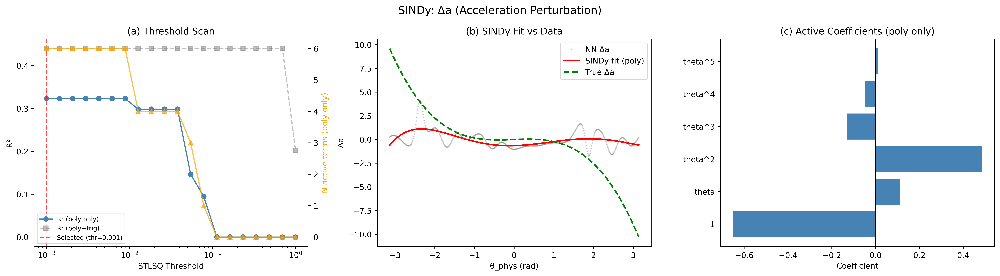

In [44]:
# ============================================================
# 11a. SINDy on Δa — scan STLSQ thresholds
# ============================================================
# We run TWO versions:
#   (A) Combined library (poly + Fourier) — flexible but collinear
#   (B) Polynomial-only library — avoids poly/trig cancellation
# ============================================================

y_da = delta_a_sorted.reshape(-1, 1)

# Scan thresholds
thresholds = np.logspace(-3, 0, 20)

# --- (A) Combined library ---
sindy_da_results_combined = []
for thr in thresholds:
    optimizer = ps.STLSQ(threshold=thr, alpha=1e-5, max_iter=50)
    sindy_model = ps.SINDy(feature_library=combined_lib, optimizer=optimizer)
    sindy_model.fit(X_sindy, t=1, x_dot=y_da, feature_names=['theta'])
    coef = sindy_model.coefficients().flatten()
    names = sindy_model.get_feature_names()
    n_active = np.sum(np.abs(coef) > 1e-10)
    pred = sindy_model.predict(X_sindy)
    ss_res = np.sum((y_da - pred)**2)
    ss_tot = np.sum((y_da - np.mean(y_da))**2)
    r2 = 1 - ss_res / ss_tot
    sindy_da_results_combined.append({
        'threshold': thr, 'n_active': n_active, 'r2': r2,
        'coef': coef.copy(), 'names': names, 'model': sindy_model,
    })

# --- (B) Polynomial-only library ---
poly_only_lib = ps.PolynomialLibrary(degree=5, include_bias=True)
sindy_da_results_poly = []
for thr in thresholds:
    optimizer = ps.STLSQ(threshold=thr, alpha=1e-5, max_iter=50)
    sindy_model = ps.SINDy(feature_library=poly_only_lib, optimizer=optimizer)
    sindy_model.fit(X_sindy, t=1, x_dot=y_da, feature_names=['theta'])
    coef = sindy_model.coefficients().flatten()
    names = sindy_model.get_feature_names()
    n_active = np.sum(np.abs(coef) > 1e-10)
    pred = sindy_model.predict(X_sindy)
    ss_res = np.sum((y_da - pred)**2)
    ss_tot = np.sum((y_da - np.mean(y_da))**2)
    r2 = 1 - ss_res / ss_tot
    sindy_da_results_poly.append({
        'threshold': thr, 'n_active': n_active, 'r2': r2,
        'coef': coef.copy(), 'names': names, 'model': sindy_model,
    })

# Print both tables side by side
print("SINDy threshold scan for Δa")
print(f"\n{'':>12s}   {'--- Combined (poly+trig) ---':>30s}   {'--- Polynomial only ---':>30s}")
print(f"{'Threshold':>12s} {'N_act':>6s} {'R²':>8s}   {'N_act':>6s} {'R²':>8s}")
print("-" * 50)
for rc, rp in zip(sindy_da_results_combined, sindy_da_results_poly):
    print(f"  {rc['threshold']:10.4f} {rc['n_active']:5d}  {rc['r2']:.4f}   {rp['n_active']:5d}  {rp['r2']:.4f}")

# Select best from polynomial-only (preferred: clean coefficients)
candidates_poly = [r for r in sindy_da_results_poly if r['n_active'] <= 5 and r['r2'] > 0.5]
if not candidates_poly:
    candidates_poly = sindy_da_results_poly
best_da_poly = max(candidates_poly, key=lambda r: r['r2'])

# Also keep combined best for reference
candidates_comb = [r for r in sindy_da_results_combined if r['n_active'] <= 5 and r['r2'] > 0.5]
if not candidates_comb:
    candidates_comb = sindy_da_results_combined
best_da_combined = max(candidates_comb, key=lambda r: r['r2'])

# Use polynomial-only as the primary result
best_da = best_da_poly

print(f"\n--- Polynomial-only best (preferred) ---")
print(f"  Threshold = {best_da['threshold']:.4f}, N_active = {best_da['n_active']}, R² = {best_da['r2']:.4f}")
print(f"\n  Discovered equation: Δa(θ) =")
for name, c in zip(best_da['names'], best_da['coef']):
    if abs(c) > 1e-10:
        print(f"    {c:+.6f} · {name}")
print(f"\n  Ground truth: Δa = {-ALPHA1:+.4f}·θ  {-ALPHA2:+.4f}·θ²  {-ALPHA3:+.4f}·θ³")

# Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 5), dpi=DPI)

# (a) Threshold scan — both libraries
ax = axes[0]
ax.semilogx([r['threshold'] for r in sindy_da_results_poly],
            [r['r2'] for r in sindy_da_results_poly], 'o-', color='steelblue', label='R² (poly only)')
ax.semilogx([r['threshold'] for r in sindy_da_results_combined],
            [r['r2'] for r in sindy_da_results_combined], 's--', color='gray', alpha=0.5, label='R² (poly+trig)')
ax.axvline(best_da['threshold'], color='red', ls='--', alpha=0.7, label=f'Selected (thr={best_da["threshold"]:.3f})')
ax.set_xlabel('STLSQ Threshold')
ax.set_ylabel('R²')
ax.legend(loc='lower left', fontsize=8)
ax2 = ax.twinx()
ax2.semilogx([r['threshold'] for r in sindy_da_results_poly],
             [r['n_active'] for r in sindy_da_results_poly], '^-', color='orange', alpha=0.7)
ax2.set_ylabel('N active terms (poly only)', color='orange')
ax.set_title('(a) Threshold Scan')

# (b) Fit vs data
ax = axes[1]
pred_best = best_da['model'].predict(X_sindy)
ax.plot(theta_phys_sorted, delta_a_sorted, '.', alpha=0.3, ms=2, color='gray', label='NN Δa')
ax.plot(theta_phys_sorted, pred_best, '-', color='red', lw=2, label='SINDy fit (poly)')
ax.plot(theta_phys_sorted, true_delta_a, '--', color='green', lw=2, label='True Δa')
ax.set_xlabel('θ_phys (rad)')
ax.set_ylabel('Δa')
ax.legend()
ax.set_title('(b) SINDy Fit vs Data')

# (c) Coefficient bar chart
ax = axes[2]
active_names = []
active_coefs = []
for name, c in zip(best_da['names'], best_da['coef']):
    if abs(c) > 1e-10:
        active_names.append(name)
        active_coefs.append(c)
bars = ax.barh(active_names, active_coefs, color='steelblue')
ax.axvline(0, color='black', lw=0.5)
ax.set_xlabel('Coefficient')
ax.set_title('(c) Active Coefficients (poly only)')

plt.suptitle('SINDy: Δa (Acceleration Perturbation)', fontsize=14)
plt.tight_layout()
plt.show()


### 11b. SINDy on ΔV (Potential Space)

Same approach applied to the potential energy difference. The expected structure is
$\Delta V \propto \frac{\alpha_1}{2}\theta^2 + \frac{\alpha_2}{3}\theta^3 + \frac{\alpha_3}{4}\theta^4$.

/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysindy/optimizers/stlsq.py:224: UserWarning: Sparsity parameter is too big (0.3359818286283781) and eliminated all coefficients
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysindy/optimizers/stlsq.py:224: UserWarning: Sparsity parameter is too big (0.4832930238571752) and eliminated all coefficients
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysindy/optimizers/stlsq.py:224: UserWarning: Sparsity parameter is too big (0.6951927961775606) and eliminated all coefficients
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysindy/optimizers/stlsq.py:224: UserWarning: Sparsity parameter is too big (1.0) and eliminated all coefficients
  warnings.warn(
/Users/harshit/miniconda3/envs/lagrangian_clean/lib/python3.9/site-packages/pysindy/optimizers/stlsq.py:224: UserWarning: Spars

SINDy threshold scan for ΔV

                 --- Combined (poly+trig) ---          --- Polynomial only ---
   Threshold  N_act       R²    N_act       R²
--------------------------------------------------
      0.0010    10  0.9591       6  0.9311
      0.0014    10  0.9591       6  0.9311
      0.0021    10  0.9591       6  0.9311
      0.0030    10  0.9591       6  0.9311
      0.0043    10  0.9591       5  0.9212
      0.0062    10  0.9591       5  0.9212
      0.0089    10  0.9591       5  0.9212
      0.0127    10  0.9591       4  0.8011
      0.0183     8  0.9590       4  0.8011
      0.0264     8  0.9590       3  0.4797
      0.0379     8  0.9590       2  0.1475
      0.0546     8  0.9590       2  0.1475
      0.0785     8  0.9590       0  -0.0641
      0.1129     6  0.8326       0  -0.0641
      0.1624     6  0.8326       0  -0.0641
      0.2336     6  0.8326       0  -0.0641
      0.3360     0  -0.0641       0  -0.0641
      0.4833     0  -0.0641       0  -0.0641
      0.6952

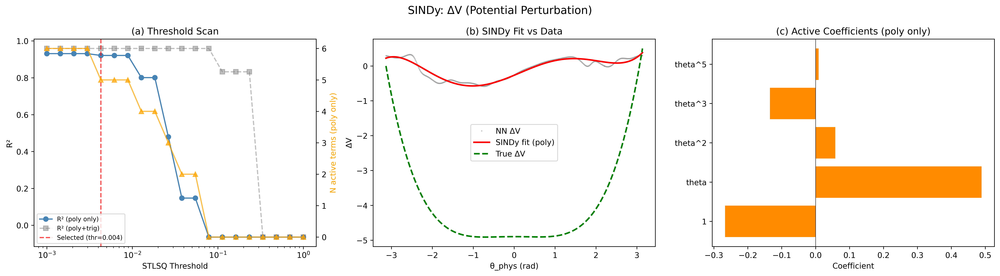

In [45]:
# ============================================================
# 11b. SINDy on ΔV — scan STLSQ thresholds
# ============================================================
# Same dual-library approach as 11a.
# ============================================================

y_dV = delta_V_sorted.reshape(-1, 1)

# --- (A) Combined library ---
sindy_dV_results_combined = []
for thr in thresholds:
    optimizer = ps.STLSQ(threshold=thr, alpha=1e-5, max_iter=50)
    sindy_model = ps.SINDy(feature_library=combined_lib, optimizer=optimizer)
    sindy_model.fit(X_sindy, t=1, x_dot=y_dV, feature_names=['theta'])
    coef = sindy_model.coefficients().flatten()
    names = sindy_model.get_feature_names()
    n_active = np.sum(np.abs(coef) > 1e-10)
    pred = sindy_model.predict(X_sindy)
    ss_res = np.sum((y_dV - pred)**2)
    ss_tot = np.sum((y_dV - np.mean(y_dV))**2)
    r2 = 1 - ss_res / ss_tot
    sindy_dV_results_combined.append({
        'threshold': thr, 'n_active': n_active, 'r2': r2,
        'coef': coef.copy(), 'names': names, 'model': sindy_model,
    })

# --- (B) Polynomial-only library ---
sindy_dV_results_poly = []
for thr in thresholds:
    optimizer = ps.STLSQ(threshold=thr, alpha=1e-5, max_iter=50)
    sindy_model = ps.SINDy(feature_library=poly_only_lib, optimizer=optimizer)
    sindy_model.fit(X_sindy, t=1, x_dot=y_dV, feature_names=['theta'])
    coef = sindy_model.coefficients().flatten()
    names = sindy_model.get_feature_names()
    n_active = np.sum(np.abs(coef) > 1e-10)
    pred = sindy_model.predict(X_sindy)
    ss_res = np.sum((y_dV - pred)**2)
    ss_tot = np.sum((y_dV - np.mean(y_dV))**2)
    r2 = 1 - ss_res / ss_tot
    sindy_dV_results_poly.append({
        'threshold': thr, 'n_active': n_active, 'r2': r2,
        'coef': coef.copy(), 'names': names, 'model': sindy_model,
    })

# Print both tables
print("SINDy threshold scan for ΔV")
print(f"\n{'':>12s}   {'--- Combined (poly+trig) ---':>30s}   {'--- Polynomial only ---':>30s}")
print(f"{'Threshold':>12s} {'N_act':>6s} {'R²':>8s}   {'N_act':>6s} {'R²':>8s}")
print("-" * 50)
for rc, rp in zip(sindy_dV_results_combined, sindy_dV_results_poly):
    print(f"  {rc['threshold']:10.4f} {rc['n_active']:5d}  {rc['r2']:.4f}   {rp['n_active']:5d}  {rp['r2']:.4f}")

# Select best from polynomial-only
candidates_poly = [r for r in sindy_dV_results_poly if r['n_active'] <= 5 and r['r2'] > 0.5]
if not candidates_poly:
    candidates_poly = sindy_dV_results_poly
best_dV_poly = max(candidates_poly, key=lambda r: r['r2'])
best_dV = best_dV_poly

print(f"\n--- Polynomial-only best (preferred) ---")
print(f"  Threshold = {best_dV['threshold']:.4f}, N_active = {best_dV['n_active']}, R² = {best_dV['r2']:.4f}")
print(f"\n  Discovered equation: ΔV(θ) =")
for name, c in zip(best_dV['names'], best_dV['coef']):
    if abs(c) > 1e-10:
        print(f"    {c:+.6f} · {name}")

print(f"\n  Ground truth (×M={M_scale:.4f}):")
print(f"    {M_scale*ALPHA1/2:+.6f} · θ²")
print(f"    {M_scale*ALPHA2/3:+.6f} · θ³")
print(f"    {M_scale*ALPHA3/4:+.6f} · θ⁴")

# Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 5), dpi=DPI)

ax = axes[0]
ax.semilogx([r['threshold'] for r in sindy_dV_results_poly],
            [r['r2'] for r in sindy_dV_results_poly], 'o-', color='steelblue', label='R² (poly only)')
ax.semilogx([r['threshold'] for r in sindy_dV_results_combined],
            [r['r2'] for r in sindy_dV_results_combined], 's--', color='gray', alpha=0.5, label='R² (poly+trig)')
ax.axvline(best_dV['threshold'], color='red', ls='--', alpha=0.7, label=f'Selected (thr={best_dV["threshold"]:.3f})')
ax.set_xlabel('STLSQ Threshold')
ax.set_ylabel('R²')
ax.legend(loc='lower left', fontsize=8)
ax2 = ax.twinx()
ax2.semilogx([r['threshold'] for r in sindy_dV_results_poly],
             [r['n_active'] for r in sindy_dV_results_poly], '^-', color='orange', alpha=0.7)
ax2.set_ylabel('N active terms (poly only)', color='orange')
ax.set_title('(a) Threshold Scan')

ax = axes[1]
pred_best_dV = best_dV['model'].predict(X_sindy)
ax.plot(theta_phys_sorted, delta_V_sorted, '.', alpha=0.3, ms=2, color='gray', label='NN ΔV')
ax.plot(theta_phys_sorted, pred_best_dV, '-', color='red', lw=2, label='SINDy fit (poly)')
ax.plot(theta_phys_sorted, true_delta_V, '--', color='green', lw=2, label='True ΔV')
ax.set_xlabel('θ_phys (rad)')
ax.set_ylabel('ΔV')
ax.legend()
ax.set_title('(b) SINDy Fit vs Data')

ax = axes[2]
active_names_V = []
active_coefs_V = []
for name, c in zip(best_dV['names'], best_dV['coef']):
    if abs(c) > 1e-10:
        active_names_V.append(name)
        active_coefs_V.append(c)
bars = ax.barh(active_names_V, active_coefs_V, color='darkorange')
ax.axvline(0, color='black', lw=0.5)
ax.set_xlabel('Coefficient')
ax.set_title('(c) Active Coefficients (poly only)')

plt.suptitle('SINDy: ΔV (Potential Perturbation)', fontsize=14)
plt.tight_layout()
plt.show()


### 11c. SINDy vs PySR Comparison

Side-by-side comparison of recovered coefficients from both methods against ground truth.

In [46]:
# ============================================================
# 11c. SINDy vs PySR comparison summary
# ============================================================
import sympy as sp
from sympy import lambdify

theta_sym = sp.Symbol('theta')

# --- Helper: extract SINDy polynomial coefficients ---
def sindy_coef_map(names, coefs):
    """Map SINDy feature names to {degree: coefficient}."""
    mapping = {'1': 0, 'theta': 1, 'theta^2': 2, 'theta^3': 3, 'theta^4': 4, 'theta^5': 5}
    result = {}
    trig = {}
    for name, c in zip(names, coefs):
        if abs(c) > 1e-10:
            if name in mapping:
                result[mapping[name]] = c
            else:
                trig[name] = c
    return result, trig

# --- Helper: extract best PySR polynomial coefficients ---
def get_pysr_best(sr_model, min_complexity=7):
    """Get the best high-complexity PySR expression as polynomial coefficients."""
    try:
        eqs = sr_model.equations_
        high_cx = eqs[eqs['complexity'] >= min_complexity]
        if len(high_cx) == 0:
            return {}, None, 0, float('inf')
        best_idx = high_cx['loss'].idxmin()
        expr = sr_model.sympy(index=best_idx)
        cx = int(high_cx.loc[best_idx, 'complexity'])
        loss = float(high_cx.loc[best_idx, 'loss'])
        try:
            coeffs = expand_to_poly_coeffs(expr, theta_sym)
        except:
            coeffs = {}
        return coeffs, expr, cx, loss
    except:
        return {}, None, 0, float('inf')

# ---- Δa comparison ----
sindy_da_poly, sindy_da_trig = sindy_coef_map(best_da['names'], best_da['coef'])
pysr_da_coeffs, pysr_da_expr, pysr_da_cx, _ = get_pysr_best(sr_delta_a)

true_da = {0: 0.0, 1: -ALPHA1, 2: -ALPHA2, 3: -ALPHA3}

print("=" * 80)
print("  COMPARISON: Δa(θ) — Acceleration Perturbation")
print("=" * 80)
print(f"\n  {'Term':<8} {'True':>10} {'SINDy(poly)':>14} {'PySR(cx={})'.format(pysr_da_cx):>14}")
print(f"  {'-'*50}")

for deg in range(6):
    term = f"θ^{deg}" if deg > 1 else ("θ" if deg == 1 else "1")
    t = true_da.get(deg, 0.0)
    s = sindy_da_poly.get(deg, 0.0)
    p = pysr_da_coeffs.get(deg, 0.0)
    if abs(t) < 1e-10 and abs(s) < 1e-10 and abs(p) < 1e-10:
        continue
    print(f"  {term:<8} {t:>10.4f} {s:>14.4f} {p:>14.4f}")

if sindy_da_trig:
    print(f"\n  SINDy trig terms (spurious): {sindy_da_trig}")

# R² comparison
print(f"\n  R² — SINDy (poly only): {best_da['r2']:.4f}")
try:
    pysr_func = lambdify(theta_sym, pysr_da_expr, modules='numpy')
    pysr_pred = pysr_func(theta_phys_sorted)
    r2_pysr = 1 - np.sum((delta_a_sorted - pysr_pred)**2) / np.sum((delta_a_sorted - np.mean(delta_a_sorted))**2)
    print(f"  R² — PySR (cx={pysr_da_cx}):    {r2_pysr:.4f}")
except:
    print(f"  R² — PySR: could not compute")

print(f"\n  PySR expression: {pysr_da_expr}")

# ---- ΔV comparison ----
sindy_dV_poly, sindy_dV_trig = sindy_coef_map(best_dV['names'], best_dV['coef'])
pysr_dV_coeffs, pysr_dV_expr, pysr_dV_cx, _ = get_pysr_best(sr_delta_V)

true_dV_dict = {0: 0.0, 2: M_scale*ALPHA1/2, 3: M_scale*ALPHA2/3, 4: M_scale*ALPHA3/4}

print(f"\n\n{'=' * 80}")
print(f"  COMPARISON: ΔV(θ) — Potential Perturbation")
print(f"{'=' * 80}")

has_pysr_dV = pysr_dV_expr is not None
if has_pysr_dV:
    print(f"\n  {'Term':<8} {'True':>10} {'SINDy(poly)':>14} {'PySR(cx={})'.format(pysr_dV_cx):>14}")
else:
    print(f"\n  {'Term':<8} {'True':>10} {'SINDy(poly)':>14}")
print(f"  {'-'*50}")

for deg in range(7):
    term = f"θ^{deg}" if deg > 1 else ("θ" if deg == 1 else "1")
    t = true_dV_dict.get(deg, 0.0)
    s = sindy_dV_poly.get(deg, 0.0)
    p = pysr_dV_coeffs.get(deg, 0.0) if has_pysr_dV else 0.0
    if abs(t) < 1e-10 and abs(s) < 1e-10 and abs(p) < 1e-10:
        continue
    if has_pysr_dV:
        print(f"  {term:<8} {t:>10.6f} {s:>14.6f} {p:>14.6f}")
    else:
        print(f"  {term:<8} {t:>10.6f} {s:>14.6f}")

if sindy_dV_trig:
    print(f"\n  SINDy trig terms (spurious): {sindy_dV_trig}")

print(f"\n  R² — SINDy (poly only): {best_dV['r2']:.4f}")
if has_pysr_dV:
    try:
        pysr_func_V = lambdify(theta_sym, pysr_dV_expr, modules='numpy')
        pysr_pred_V = pysr_func_V(theta_phys_sorted)
        r2_pysr_V = 1 - np.sum((delta_V_sorted - pysr_pred_V)**2) / np.sum((delta_V_sorted - np.mean(delta_V_sorted))**2)
        print(f"  R² — PySR (cx={pysr_dV_cx}):    {r2_pysr_V:.4f}")
    except:
        print(f"  R² — PySR: could not compute")
    print(f"\n  PySR expression: {pysr_dV_expr}")


  COMPARISON: Δa(θ) — Acceleration Perturbation

  Term           True    SINDy(poly)    PySR(cx=19)
  --------------------------------------------------
  1            0.0000        -0.6514        -0.6528
  θ            0.1443         0.1101         0.0000
  θ^2         -0.0339         0.4857         0.4846
  θ^3         -0.3375        -0.1325        -0.0940
  θ^4          0.0000        -0.0489        -0.0487
  θ^5          0.0000         0.0124         0.0094

  R² — SINDy (poly only): 0.3230
  R² — PySR (cx=19):    0.3205

  PySR expression: theta*theta*(theta*(-0.113094956) - 1*(-0.583333))*(theta*(-0.08343586)*theta - 1*(-0.83076984)) - 0.652774


  COMPARISON: ΔV(θ) — Potential Perturbation

  Term           True    SINDy(poly)    PySR(cx=19)
  --------------------------------------------------
  1          0.000000      -0.266941      -0.205264
  θ          0.000000       0.489193       0.488789
  θ^2       -0.049893       0.057878       0.000000
  θ^3        0.007814      -0.13